In [1]:
import os
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

# Set your dataset path
dataset_path = r"C:\Users\chris\Downloads\fashion dataset"

csv_path = os.path.join(dataset_path, "data.csv")
images_path = os.path.join(dataset_path, "data")

# Load CSV
df = pd.read_csv(csv_path)

df.head()


,image,description,display name,category
0,3238.jpg,"Round toed, black sports shoes with red accent...",Puma Men Black 65CC Lo Ducati Sports Shoes,Sports Shoes
1,43044.jpg,Style Note Built with the breathability and ze...,Nike Men Charcoal Grey Shorts,Shorts
2,54018.jpg,Teal handbag that has stitch detailing with a...,Kiara Women Teal Handbag,Handbags
3,8141.jpg,"Perfectly stylish, this fastrack analog wrist ...",Fastrack Women Freestyle Sports Analog Steel B...,Watches
4,22245.jpg,These id mid-top chukka shoes add a fresh spin...,ID Men Brown Casual Shoes,Casual Shoes


In [2]:
# Check if image files exist
missing_images = []

for img_name in df["image"]:
    img_path = os.path.join(images_path, img_name)
    if not os.path.exists(img_path):
        missing_images.append(img_name)

print("Total missing images:", len(missing_images))
missing_images[:10]


Total missing images: 0


[]

Display Name: Lee Women Solid White Tops
Category: Tops
Description: Composition White top made of 100% cotton, with short sleeves held up by buttoned flaps, Mandarin collar neck with a buttoned chest placket, pintucks on the bust, ruched at the waist and has a flared out hem with embroidered branding at the back neck   Fitting Regular   Wash care Machine wash warm using a mild detergent Wash dark colours separately Turn inside out before washing and drying Do not bleach or wring Tumble dry or flat dry in shade Warm iron   A perfect wear for weekend parties during the day, this white top from lee combines the feminine and the hep styles especially for you. Flaunt your well curved waist and hide that small tummy in style with this top, while the cotton fabric keeps you fresh and comfortable all day. Team it with slim Fit jeans and stilletos for unparalleled cool.  Model statistics  The model wears size M in tops Height: 5'7"; Chest: 33"; Waist: 25"


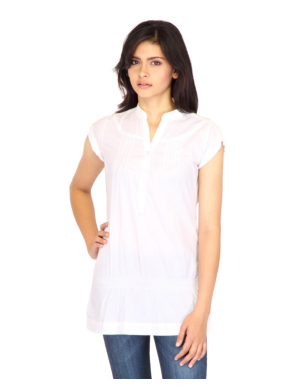

In [3]:
# Show a random sample image with description
sample_row = df.sample(1).iloc[0]
img_file = os.path.join(images_path, sample_row["image"])

img = Image.open(img_file)
plt.imshow(img)
plt.axis("off")

print("Display Name:", sample_row["display name"])
print("Category:", sample_row["category"])
print("Description:", sample_row["description"])


In [4]:
import re

def clean_text(text):
    if isinstance(text, str):
        text = text.lower()
        text = re.sub(r"[^a-z0-9\s]", "", text)
        text = re.sub(r"\s+", " ", text).strip()
        return text
    return ""

df["clean_description"] = df["description"].apply(clean_text)

df[["description", "clean_description"]].head()


,description,clean_description
0,"Round toed, black sports shoes with red accent...",round toed black sports shoes with red accents...
1,Style Note Built with the breathability and ze...,style note built with the breathability and ze...
2,Teal handbag that has stitch detailing with a...,teal handbag that has stitch detailing with a ...
3,"Perfectly stylish, this fastrack analog wrist ...",perfectly stylish this fastrack analog wrist w...
4,These id mid-top chukka shoes add a fresh spin...,these id midtop chukka shoes add a fresh spin ...


In [50]:
!pip install git+https://github.com/openai/CLIP.git
!pip install faiss-cpu
!pip install pillow matplotlib


  Cloning https://github.com/openai/CLIP.git to c:\users\chris\appdata\local\temp\pip-req-build-hab5cvqd
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'


  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git 'C:\Users\chris\AppData\Local\Temp\pip-req-build-hab5cvqd'


In [66]:
# ========== Cell A ==========
# Prepare combined text_for_clip and absolute image paths

import numpy as np

def make_text_for_clip(row):
    # combine display name + category + clean_description with separators
    parts = []
    for col in ['display name', 'category', 'clean_description']:
        v = row.get(col, "")
        if pd.isna(v):
            v = ""
        v = str(v).strip()
        if v:
            parts.append(v)
    # use a separator to give model some structure
    return " | ".join(parts)

# create the field
df['text_for_clip'] = df.apply(make_text_for_clip, axis=1)

# create absolute image path field (use the images_path variable you defined earlier)
df['image_path'] = df['image'].astype(str).apply(lambda fn: os.path.join(images_path, fn))

# quick checks
print("Total rows:", len(df))
print("Example text_for_clip (first 5):")
for t in df['text_for_clip'].head(5).tolist():
    print("-", t[:200])  # print only first 200 chars for brevity

# check any missing image paths (files that still don't exist)
missing = df[~df['image_path'].apply(os.path.exists)]
print("Files missing on disk (sample up to 10):", missing.shape[0])
print(missing['image'].head(10).tolist())

# show one sample row
sample_row = df.sample(1).iloc[0]
print("\nSample row text_for_clip:")
print(sample_row['text_for_clip'])
print("Sample image path exists?:", os.path.exists(sample_row['image_path']))


Total rows: 44441
Example text_for_clip (first 5):
- Puma Men Black 65CC Lo Ducati Sports Shoes | Sports Shoes | round toed black sports shoes with red accents low top styling and central laceups leather upper with stitched detail overlay formstrip and 
- Nike Men Charcoal Grey Shorts | Shorts | style note built with the breathability and zerodistraction fit that athletes demand these boardshorts come in a bodyfriendly design these highperformance shor
- Kiara Women Teal Handbag | Handbags | teal handbag that has stitch detailing with a pleated and panel design on the front one main zipped compartment that has an inner zipped pocket and an organiser s
- Fastrack Women Freestyle Sports Analog Steel Black Watch | Watches | perfectly stylish this fastrack analog wrist watch is a great buy for those who enjoy performance and style with excellent touches 
- ID Men Brown Casual Shoes | Casual Shoes | these id midtop chukka shoes add a fresh spin on a classic style with its wide midsole the h

In [69]:
import clip
import torch
from tqdm.auto import tqdm
import numpy as np
import os
import time
import math

# --- CONFIG ---
# If you want to test quickly on a small subset, set SAMPLE_N to an int (e.g., 200).
# Otherwise set SAMPLE_N = None to encode the whole dataset.
SAMPLE_N = None      # e.g., 200 or None
BATCH_SIZE = 64      # reduce to 32 if CPU is too slow / OOM
CHECKPOINT_EVERY = 10   # save partial checkpoint every this many batches

# --- device & model ---
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

model, preprocess = clip.load("ViT-B/32", device=device)
model.eval()

# --- prepare texts (optionally subset) ---
texts_all = df['text_for_clip'].astype(str).tolist()
if SAMPLE_N is not None:
    texts = texts_all[:SAMPLE_N]
else:
    texts = texts_all
N = len(texts)
print("Number of texts to encode:", N)

# --- prepare arrays & paths ---
text_embs = np.zeros((N, 512), dtype=np.float32)
OUT_DIR = os.path.join(dataset_path, "clip_outputs")
os.makedirs(OUT_DIR, exist_ok=True)
partial_path = os.path.join(OUT_DIR, "text_embs_partial.npy")
final_path = os.path.join(OUT_DIR, "text_embs.npy")

# --- encode with progress tracking & ETA ---
total_batches = math.ceil(N / BATCH_SIZE)
start_time = time.time()

with torch.no_grad():
    for batch_idx, i in enumerate(range(0, N, BATCH_SIZE), start=1):
        batch_texts = texts[i:i+BATCH_SIZE]
        # ---- progress info (printed) ----
        elapsed = time.time() - start_time
        batches_done = batch_idx
        eta_seconds = (elapsed / batches_done) * (total_batches - batches_done) if batches_done > 0 else 0
        eta_min = eta_seconds / 60
        print(f"[{time.strftime('%H:%M:%S')}] Batch {batches_done}/{total_batches} | "
              f"Items {i}-{i+len(batch_texts)-1} | Elapsed: {elapsed:.1f}s | ETA: {eta_min:.2f}m")

        # tokenize + encode
        tokens = clip.tokenize(batch_texts, truncate=True).to(device)
        emb = model.encode_text(tokens)               # tensor on device
        emb = emb.cpu().numpy().astype(np.float32)    # move to CPU numpy

        # normalize
        norms = np.linalg.norm(emb, axis=1, keepdims=True)
        norms[norms == 0] = 1.0
        emb = emb / norms

        # store
        text_embs[i:i+len(batch_texts)] = emb

        # checkpoint save
        if (batch_idx % CHECKPOINT_EVERY) == 0:
            np.save(partial_path, text_embs)
            print(f"  -> checkpoint saved to {partial_path} (batch {batch_idx})")

# final save
np.save(final_path, text_embs)
print("Final text embeddings saved to:", final_path)
print("Text embeddings shape:", text_embs.shape)
print("Sample text embedding (first 8 values):", text_embs[0][:8])

Using device: cpu
Number of texts to encode: 44441
[09:27:36] Batch 1/695 | Items 0-63 | Elapsed: 0.0s | ETA: 0.01m
[09:27:40] Batch 2/695 | Items 64-127 | Elapsed: 3.9s | ETA: 22.64m
[09:27:43] Batch 3/695 | Items 128-191 | Elapsed: 6.9s | ETA: 26.68m
[09:27:46] Batch 4/695 | Items 192-255 | Elapsed: 9.5s | ETA: 27.33m
[09:27:49] Batch 5/695 | Items 256-319 | Elapsed: 12.5s | ETA: 28.68m
[09:27:52] Batch 6/695 | Items 320-383 | Elapsed: 15.9s | ETA: 30.49m
[09:28:01] Batch 7/695 | Items 384-447 | Elapsed: 24.3s | ETA: 39.77m
[09:28:04] Batch 8/695 | Items 448-511 | Elapsed: 27.7s | ETA: 39.58m
[09:28:07] Batch 9/695 | Items 512-575 | Elapsed: 30.6s | ETA: 38.85m
[09:28:10] Batch 10/695 | Items 576-639 | Elapsed: 33.7s | ETA: 38.42m
  -> checkpoint saved to C:\Users\chris\Downloads\fashion dataset\clip_outputs\text_embs_partial.npy (batch 10)
[09:28:14] Batch 11/695 | Items 640-703 | Elapsed: 37.7s | ETA: 39.08m
[09:28:17] Batch 12/695 | Items 704-767 | Elapsed: 40.5s | ETA: 38.38m
[09

In [70]:
# ========== Cell C ==========
# Encode all images with CLIP (batched, with safe fallback)

import numpy as np
import torch
from tqdm.auto import tqdm
from PIL import Image
import os
import math
import time

BATCH_SIZE_IMG = 64   # reduce if CPU slow
OUT_DIR = os.path.join(dataset_path, "clip_outputs")
os.makedirs(OUT_DIR, exist_ok=True)
image_embs_path = os.path.join(OUT_DIR, "image_embs.npy")

def load_image_safe(path, preprocess, image_size=224):
    """Load image and preprocess; if missing/corrupted return blank image."""
    try:
        img = Image.open(path).convert("RGB")
    except:
        img = Image.new("RGB", (image_size, image_size), (255, 255, 255))
    return preprocess(img)

N = len(df)
image_embs = np.zeros((N, 512), dtype=np.float32)

print("Encoding", N, "images...")

start = time.time()
total_batches = math.ceil(N / BATCH_SIZE_IMG)

with torch.no_grad():
    for batch_idx, i in enumerate(range(0, N, BATCH_SIZE_IMG), start=1):
        batch_paths = df["image_path"].iloc[i:i+BATCH_SIZE_IMG].tolist()

        # progress tracking
        elapsed = time.time() - start
        eta = (elapsed / batch_idx) * (total_batches - batch_idx)
        print(f"Batch {batch_idx}/{total_batches} | Elapsed: {elapsed/60:.2f}m | ETA: {eta/60:.2f}m")

        images = [load_image_safe(p, preprocess) for p in batch_paths]
        images_tensor = torch.stack(images).to(device)

        emb = model.encode_image(images_tensor)
        emb = emb.cpu().numpy().astype(np.float32)

        # L2 normalize
        norms = np.linalg.norm(emb, axis=1, keepdims=True)
        norms[norms == 0] = 1.0
        emb = emb / norms

        image_embs[i:i+len(batch_paths)] = emb

        # periodic save
        if batch_idx % 20 == 0:
            np.save(os.path.join(OUT_DIR, "image_embs_partial.npy"), image_embs)
            print("  -> partial saved")

# final save
np.save(image_embs_path, image_embs)
print("Image embeddings saved to:", image_embs_path)
print("Image embeddings shape:", image_embs.shape)
print("Sample image embedding:", image_embs[0][:8])


Encoding 44441 images...
Batch 1/695 | Elapsed: 0.00m | ETA: 0.70m
Batch 2/695 | Elapsed: 0.19m | ETA: 66.43m
Batch 3/695 | Elapsed: 0.53m | ETA: 122.46m
Batch 4/695 | Elapsed: 0.67m | ETA: 116.24m
Batch 5/695 | Elapsed: 0.89m | ETA: 123.30m
Batch 6/695 | Elapsed: 0.99m | ETA: 114.10m
Batch 7/695 | Elapsed: 1.11m | ETA: 108.76m
Batch 8/695 | Elapsed: 1.23m | ETA: 105.47m
Batch 9/695 | Elapsed: 1.34m | ETA: 102.48m
Batch 10/695 | Elapsed: 1.65m | ETA: 112.70m
Batch 11/695 | Elapsed: 2.07m | ETA: 128.52m
Batch 12/695 | Elapsed: 2.29m | ETA: 130.39m
Batch 13/695 | Elapsed: 2.47m | ETA: 129.53m
Batch 14/695 | Elapsed: 2.68m | ETA: 130.42m
Batch 15/695 | Elapsed: 2.96m | ETA: 134.35m
Batch 16/695 | Elapsed: 3.15m | ETA: 133.50m
Batch 17/695 | Elapsed: 3.34m | ETA: 133.11m
Batch 18/695 | Elapsed: 3.53m | ETA: 132.89m
Batch 19/695 | Elapsed: 3.70m | ETA: 131.69m
Batch 20/695 | Elapsed: 3.86m | ETA: 130.18m
  -> partial saved
Batch 21/695 | Elapsed: 4.05m | ETA: 130.06m
Batch 22/695 | Elapsed:

In [71]:
# ========== Cell D ==========
# Create 512-dim multimodal embeddings (weighted average)

import numpy as np
import os

OUT_DIR = os.path.join(dataset_path, "clip_outputs")

# load text & image embeddings
text_embs = np.load(os.path.join(OUT_DIR, "text_embs.npy"))
image_embs = np.load(os.path.join(OUT_DIR, "image_embs.npy"))

print("Text embeddings shape:", text_embs.shape)
print("Image embeddings shape:", image_embs.shape)

# equal weights (you can tune alpha if needed)
alpha = 0.5

multimodal_embs = alpha * text_embs + (1 - alpha) * image_embs

# L2 normalize
norms = np.linalg.norm(multimodal_embs, axis=1, keepdims=True)
norms[norms == 0] = 1.0
multimodal_embs = multimodal_embs / norms

# save
multi_path = os.path.join(OUT_DIR, "multimodal_embs.npy")
np.save(multi_path, multimodal_embs)

print("Multimodal embeddings saved to:", multi_path)
print("Multimodal embeddings shape:", multimodal_embs.shape)
print("Sample multimodal embedding:", multimodal_embs[0][:8])


Text embeddings shape: (44441, 512)
Image embeddings shape: (44441, 512)
Multimodal embeddings saved to: C:\Users\chris\Downloads\fashion dataset\clip_outputs\multimodal_embs.npy
Multimodal embeddings shape: (44441, 512)
Sample multimodal embedding: [-0.04220905 -0.01099441  0.04045273  0.00605467 -0.019865    0.05612785
 -0.06243988  0.06091777]


In [72]:
# ========== Cell E ==========
# Build FAISS index using 512-d multimodal embeddings

import faiss
import numpy as np
import os

OUT_DIR = os.path.join(dataset_path, "clip_outputs")
multi_path = os.path.join(OUT_DIR, "multimodal_embs.npy")

# load multimodal embeddings
multimodal_embs = np.load(multi_path).astype("float32")

# dimension should be 512
d = multimodal_embs.shape[1]
print("Embedding dimension:", d)

# build FAISS index (Inner Product for cosine)
index = faiss.IndexFlatIP(d)

# add vectors
index.add(multimodal_embs)

print("FAISS index built!")
print("Number of vectors in index:", index.ntotal)

# save index
faiss_path = os.path.join(OUT_DIR, "faiss_multimodal.index")
faiss.write_index(index, faiss_path)
print("FAISS index saved to:", faiss_path)


Embedding dimension: 512
FAISS index built!
Number of vectors in index: 44441
FAISS index saved to: C:\Users\chris\Downloads\fashion dataset\clip_outputs\faiss_multimodal.index


In [73]:
# ========== Cell F ==========
# Text-based search using FAISS + CLIP text encoder

import numpy as np
import torch
import clip
from PIL import Image

# reload CLIP model (in case kernel restarted)
model, preprocess = clip.load("ViT-B/32", device=device)
model.eval()

# reload FAISS index to ensure consistency
index = faiss.read_index(os.path.join(OUT_DIR, "faiss_multimodal.index"))

def search_by_text(query, k=5):
    # 1. Encode query text
    with torch.no_grad():
        tokens = clip.tokenize([query], truncate=True).to(device)
        q_text = model.encode_text(tokens).cpu().numpy().astype("float32")

    # 2. Normalize
    q_text = q_text / np.linalg.norm(q_text, axis=1, keepdims=True)

    # 3. Text-only multimodal: image part = zero vector
    q_vec = q_text  # 512-d because we used averaged multimodal

    # normalize again
    q_vec = q_vec / np.linalg.norm(q_vec, axis=1, keepdims=True)

    # 4. Search FAISS
    D, I = index.search(q_vec.astype("float32"), k)

    # 5. Prepare results
    results = []
    for score, idx in zip(D[0], I[0]):
        row = df.iloc[idx]
        results.append({
            "index": int(idx),
            "score": float(score),
            "image_path": row["image_path"],
            "display name": row["display name"],
            "category": row["category"],
            "description": row["description"]
        })
    return results

print("search_by_text is ready to use!")


search_by_text is ready to use!


In [74]:
results = search_by_text("red floral dress", k=5)
results


[{'index': 3236,
  'score': 0.5880163908004761,
  'image_path': 'C:\\Users\\chris\\Downloads\\fashion dataset\\data\\39217.jpg',
  'display name': 'Femella Women Floral Red Dress',
  'category': 'Dresses',
  'description': 'Style Note femella does chic casual in their trademark uber cool style with these tops. Printed and creatively designed, this dress is a wardrobe essential that we can\'t do without! Paired with a short pencil skirt and heeled sandals, you\'ll be dressed to impress.   Product Details Black, red, green and white floral printed dress, has an inner black lining, U neckline, sleeveless, gathered waist, asymmetrical hemline which is longer at the back and a concealed zipper on one side   Material and Care Blended fabric Wash cold with like colours Do not wring or bleach Dry inside out Use warm iron   Size and Fit Regular fit The model (height 5\'8" and chest 33") is wearing a size M'},
 {'index': 33786,
  'score': 0.5851483345031738,
  'image_path': 'C:\\Users\\chris\\Do

In [78]:
# ========== Updated Cell H ==========
# Display results with Images + Name + Category + Description

from IPython.display import display, HTML
import base64

def show_results(results, img_size=200, show_description=True):
    html = "<div style='display:flex; flex-wrap:wrap; gap:20px;'>"
    
    for r in results:
        img_path = r["image_path"]

        # convert image to base64
        try:
            with open(img_path, "rb") as f:
                img_data = base64.b64encode(f.read()).decode('utf-8')
            img_tag = f"<img src='data:image/jpeg;base64,{img_data}' style='width:{img_size}px; height:auto; border-radius:8px;'>"
        except:
            img_tag = "<div style='width:200px;height:200px;background:#eee;border-radius:8px;display:flex;align-items:center;justify-content:center;'>No Image</div>"

        # description (optional)
        desc_html = ""
        if show_description:
            desc_html = f"<div style='font-size:12px; color:#444; margin-top:4px; height:90px; overflow:hidden;'>{r['description']}</div>"

        html += f"""
        <div style='width:{img_size}px'>
            {img_tag}
            <div style='font-size:14px; margin-top:5px;'>
                <b>{r['display name']}</b><br>
                <i>{r['category']}</i><br>
                <span style='font-size:12px; color:#555;'>Score: {r['score']:.4f}</span>
                {desc_html}
            </div>
        </div>
        """

    html += "</div>"
    display(HTML(html))

print("show_results() updated with descriptions!")


show_results() updated with descriptions!



QUERY: red floral dress



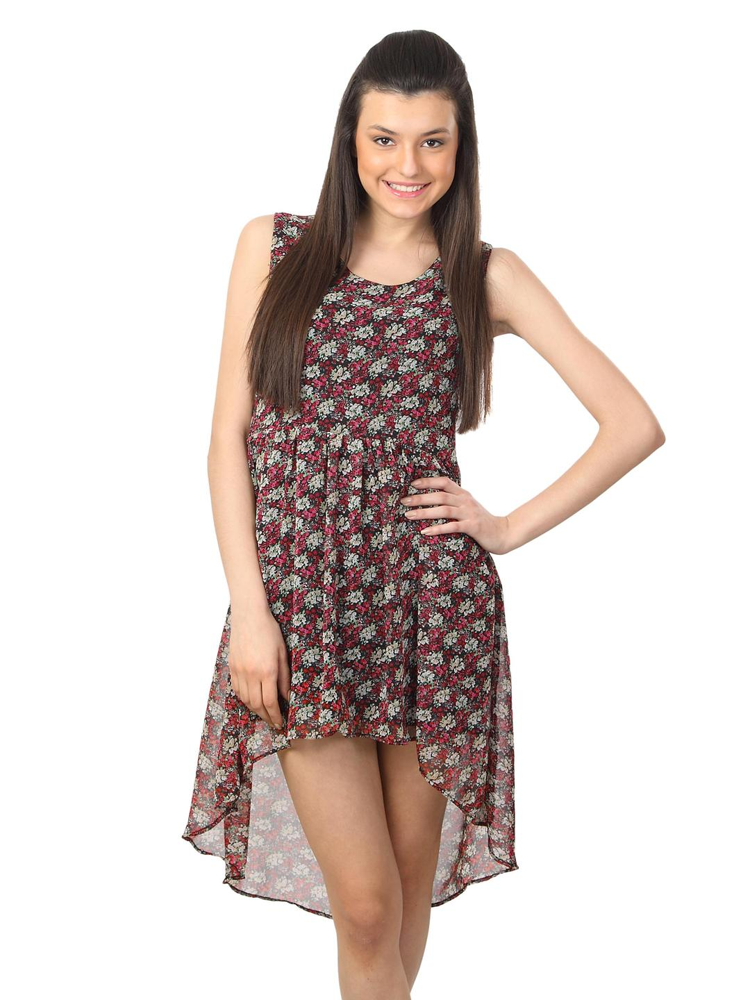
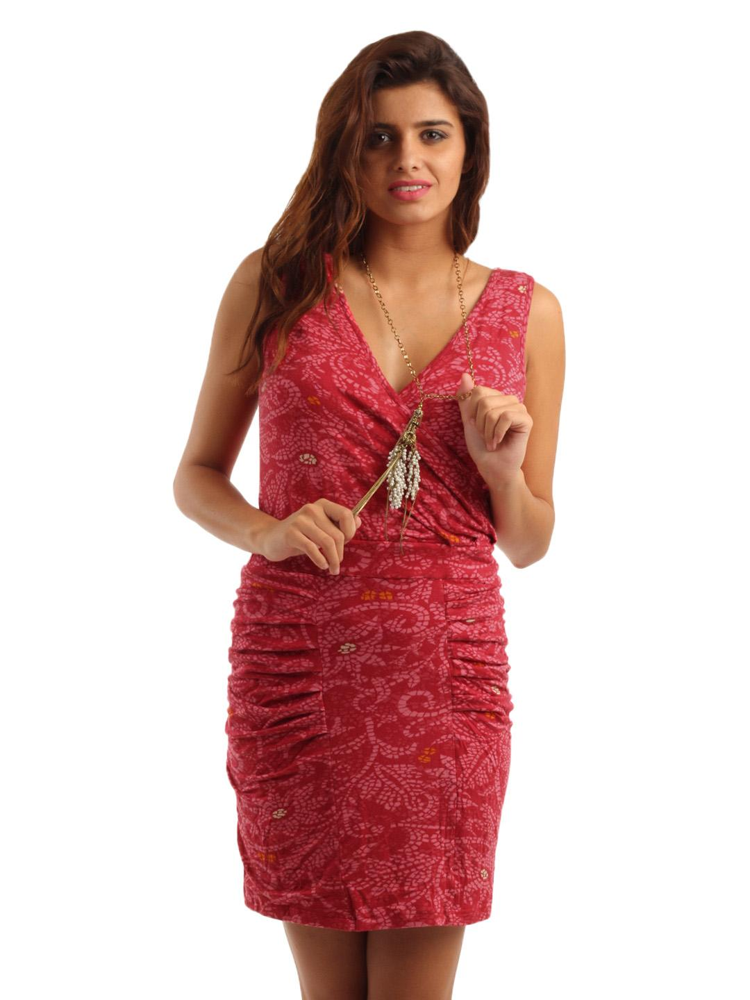
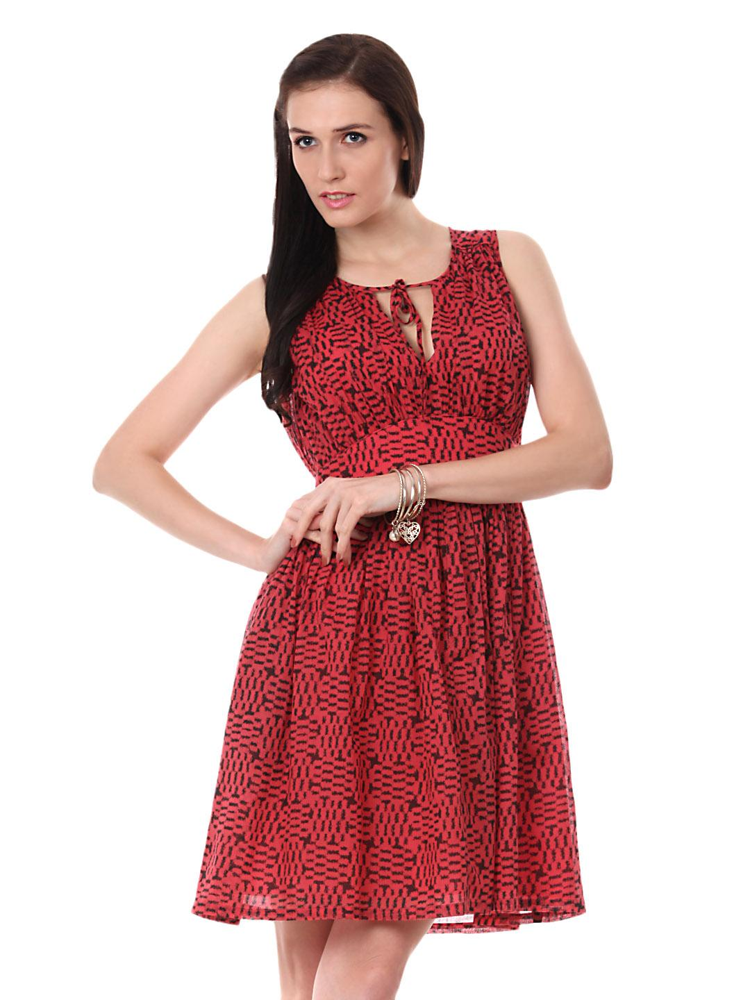
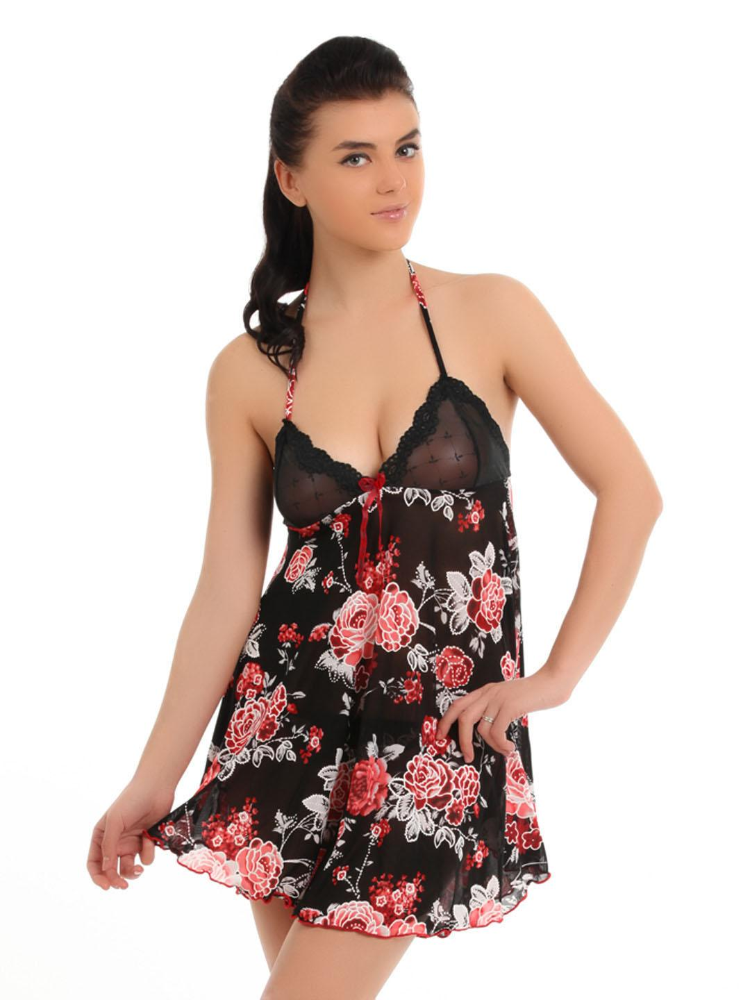
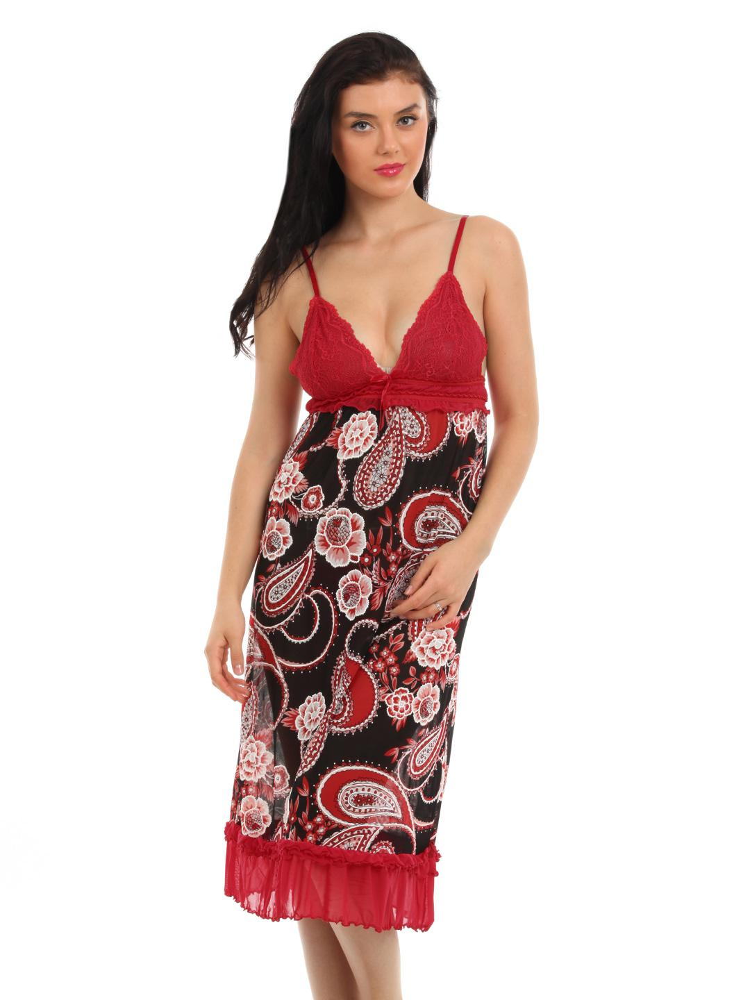
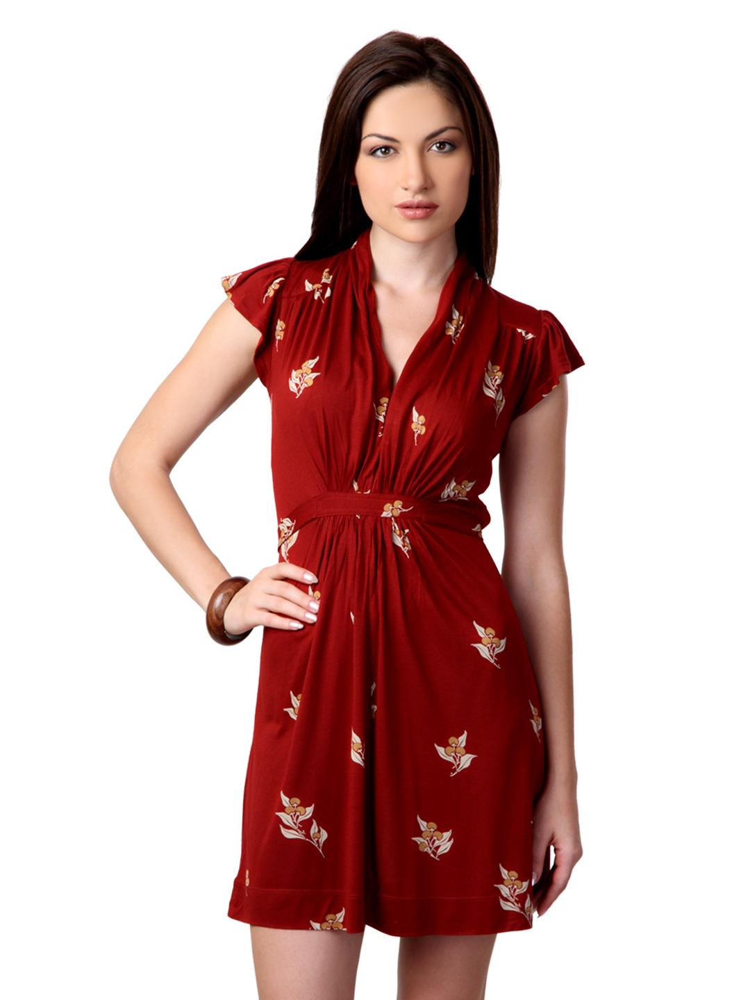


QUERY: black men's jacket



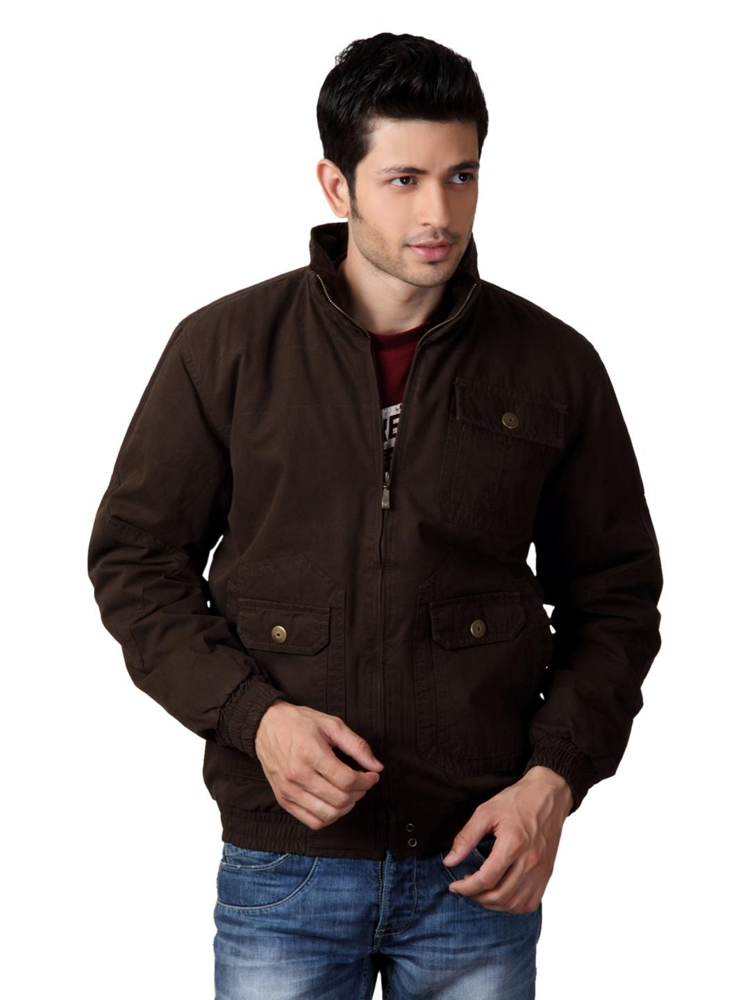
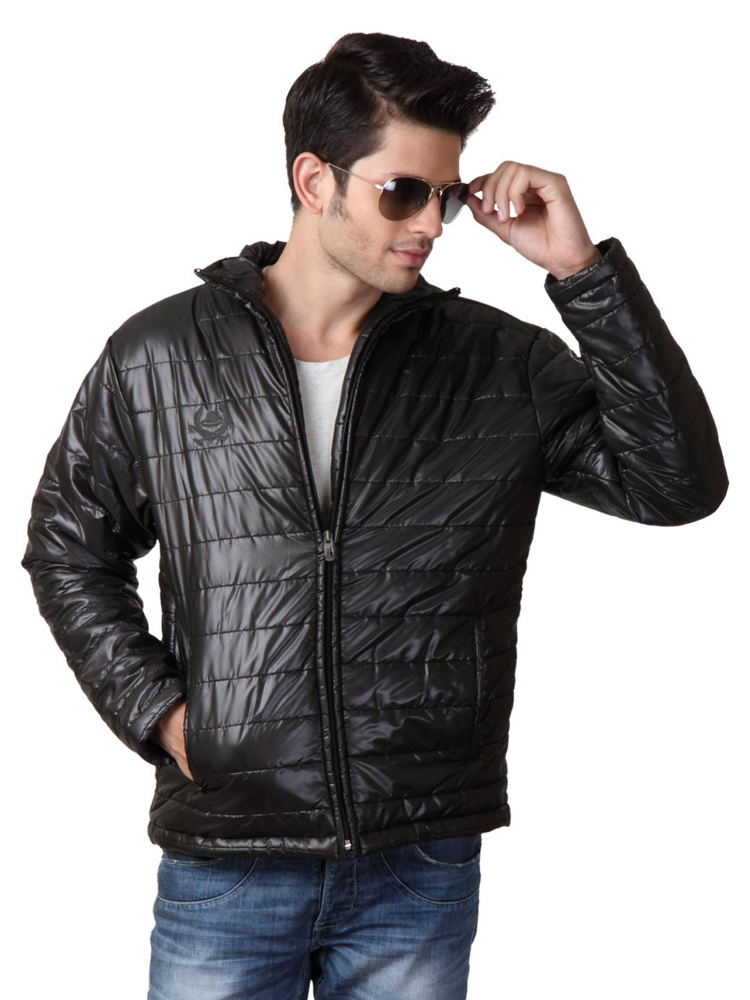
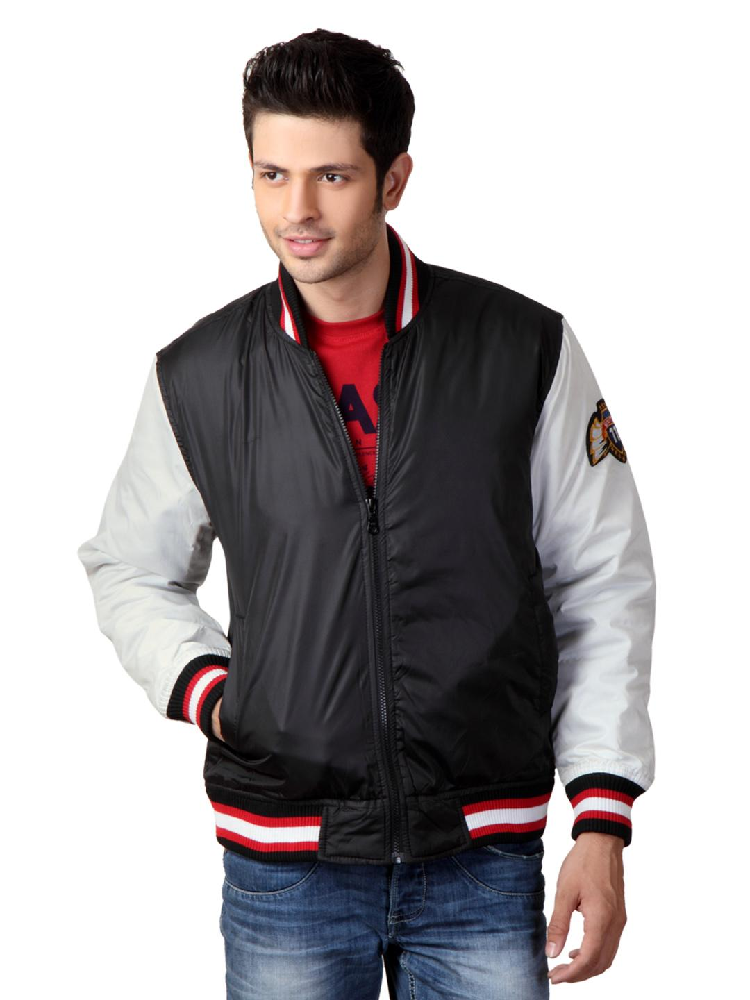
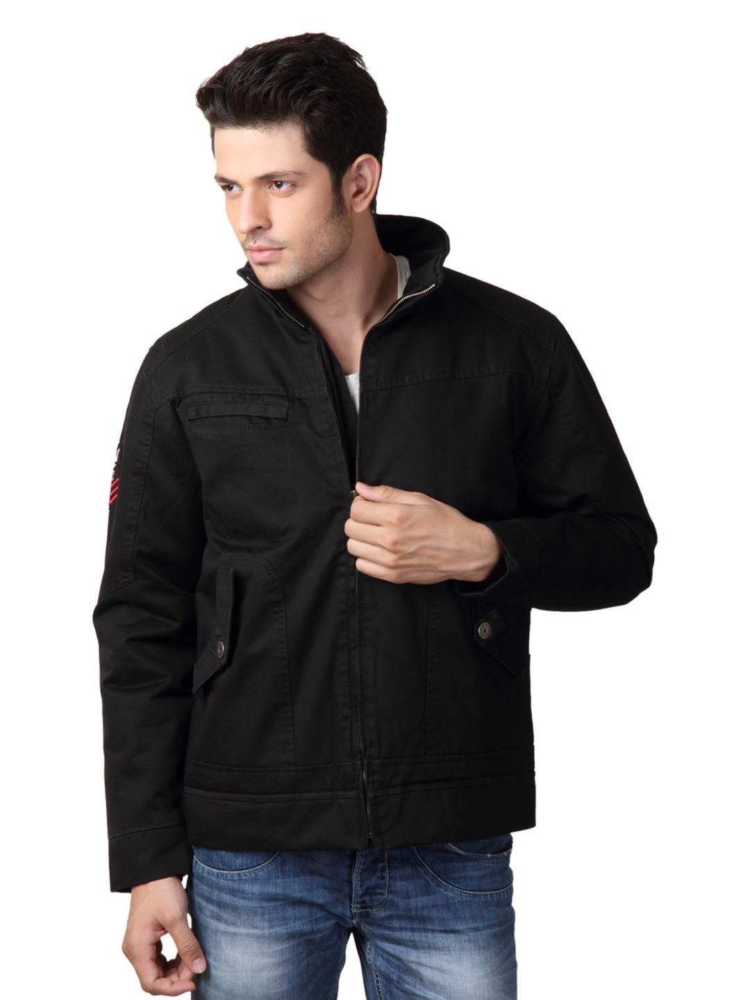
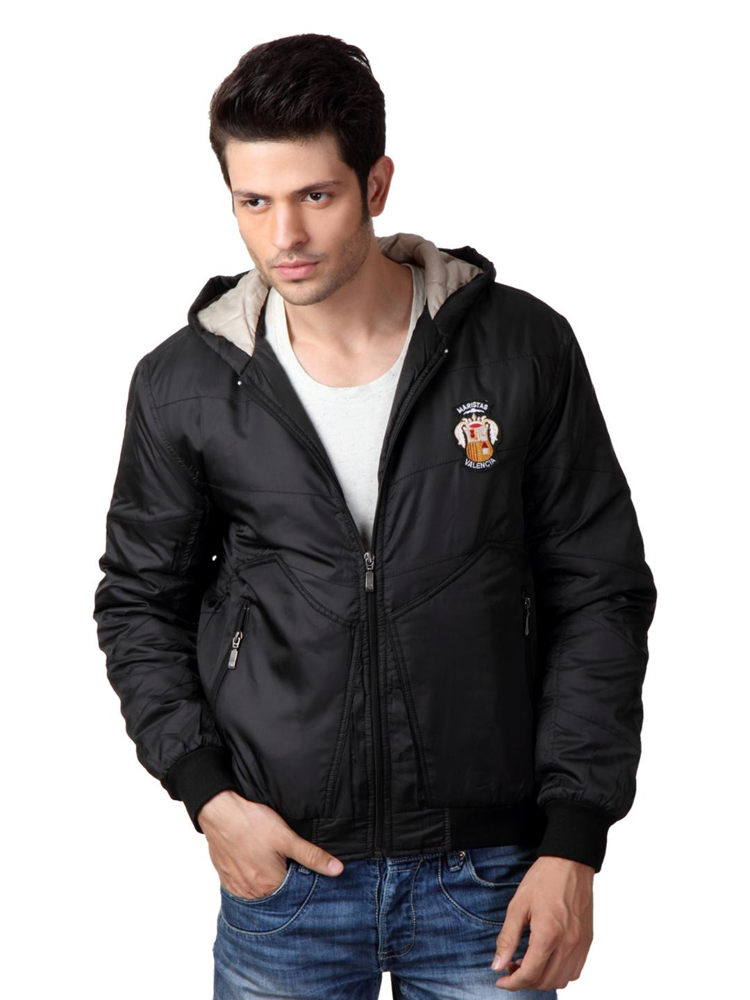
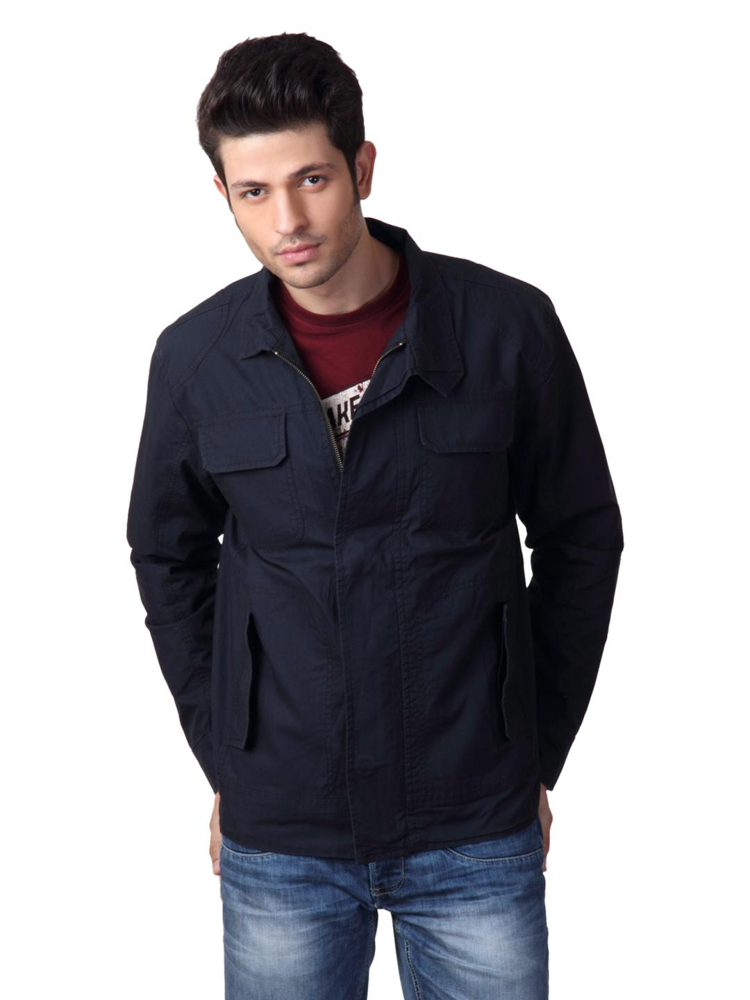


QUERY: blue denim jeans



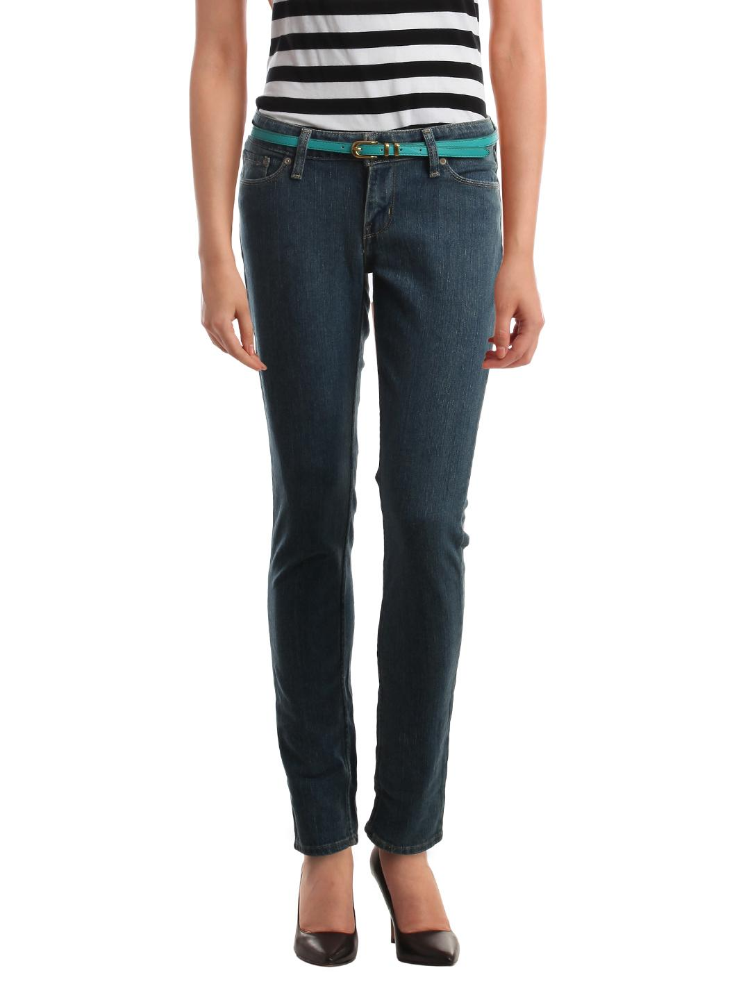
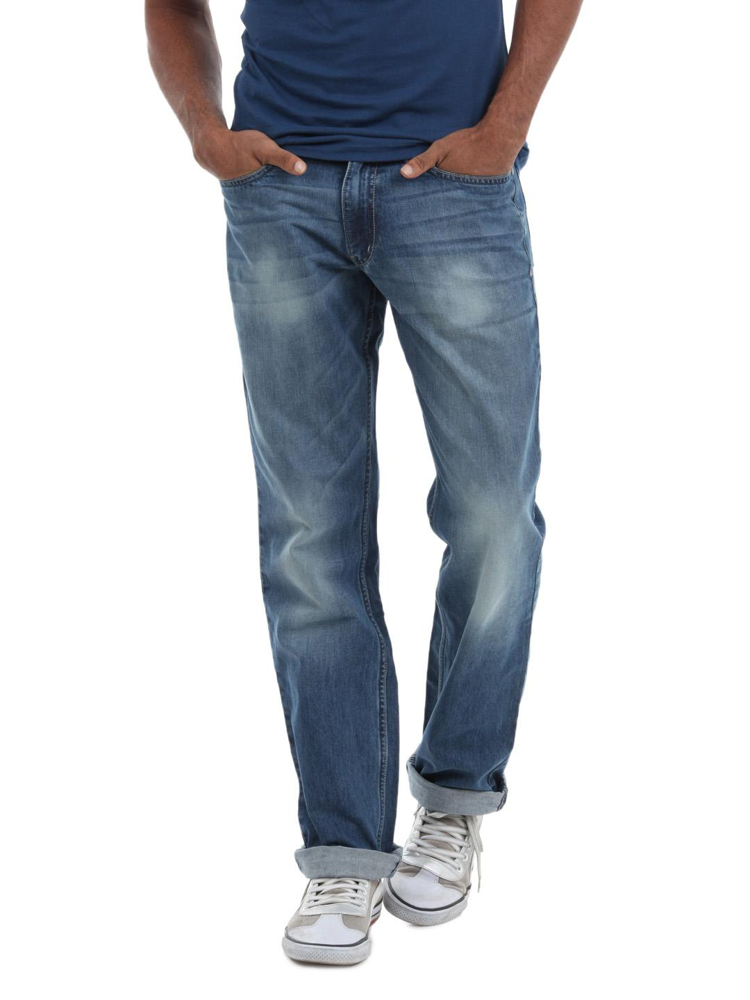
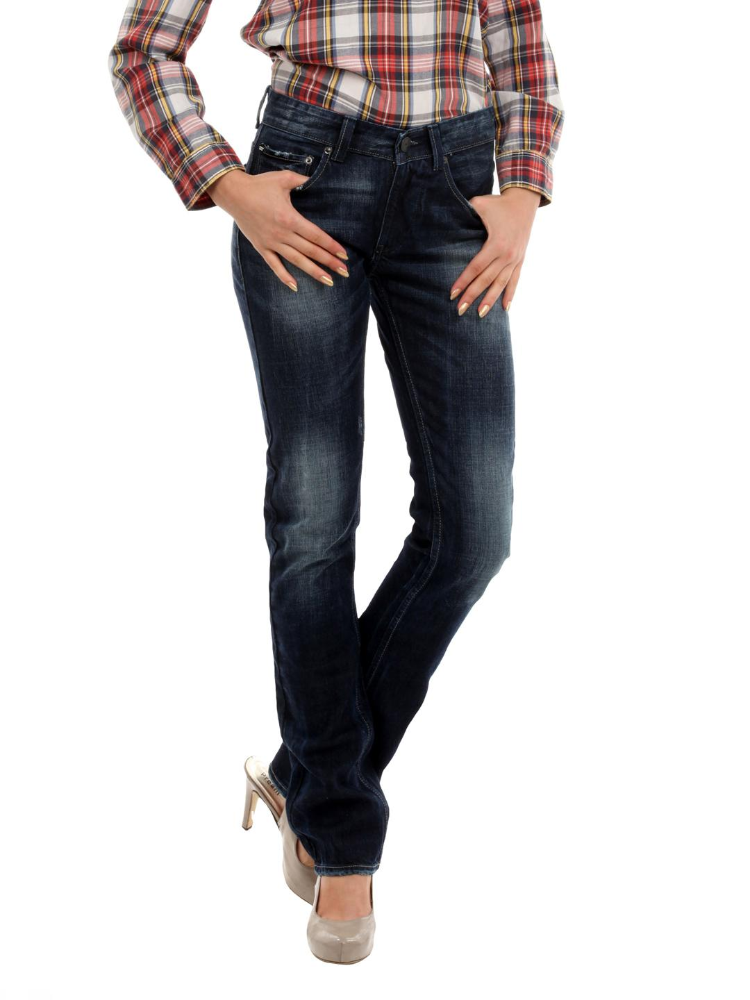
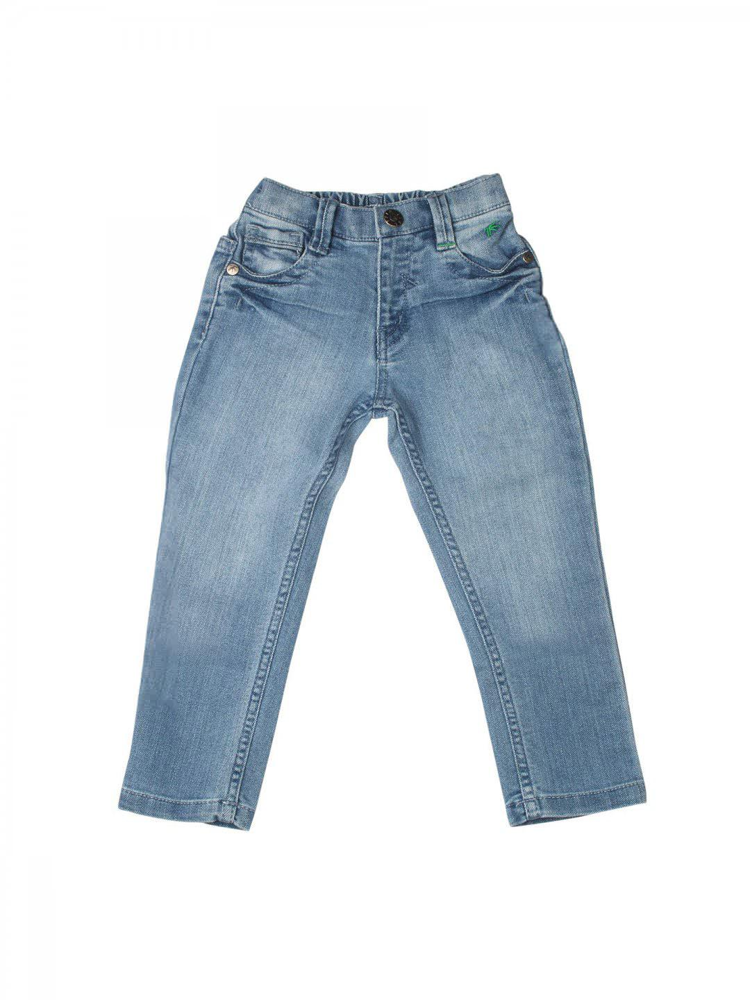
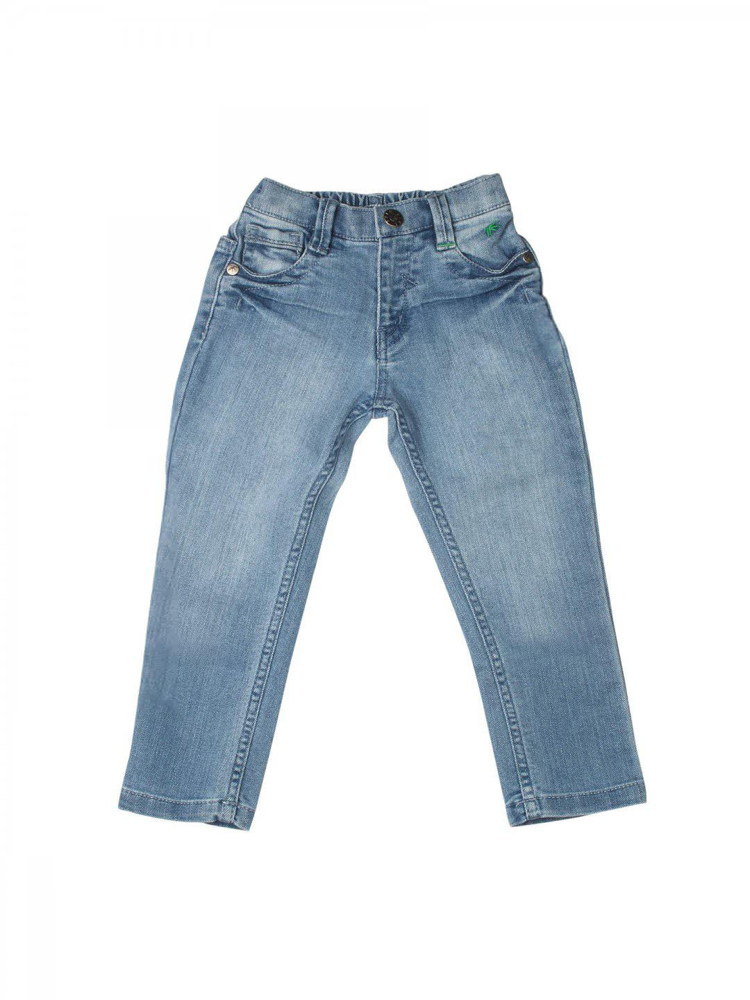
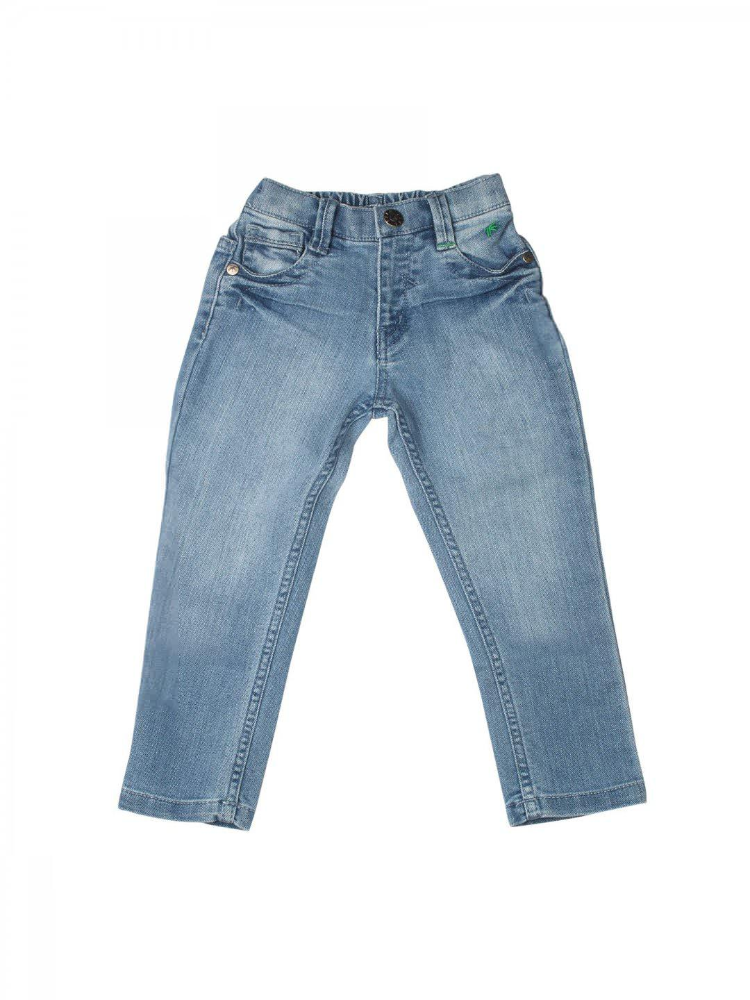


QUERY: women white top



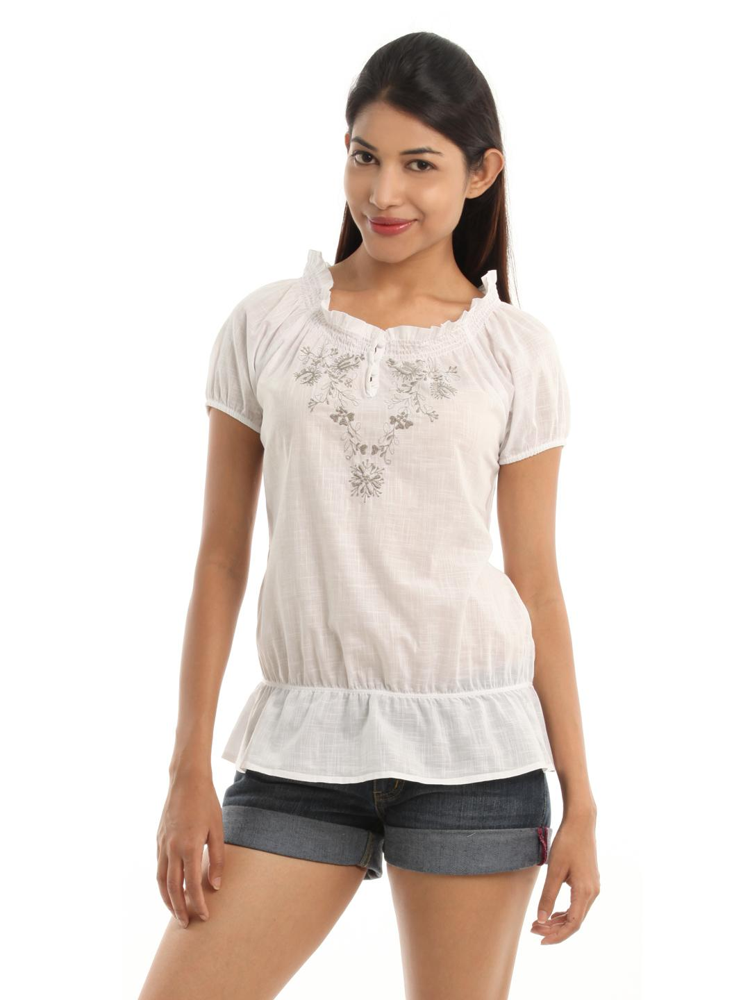
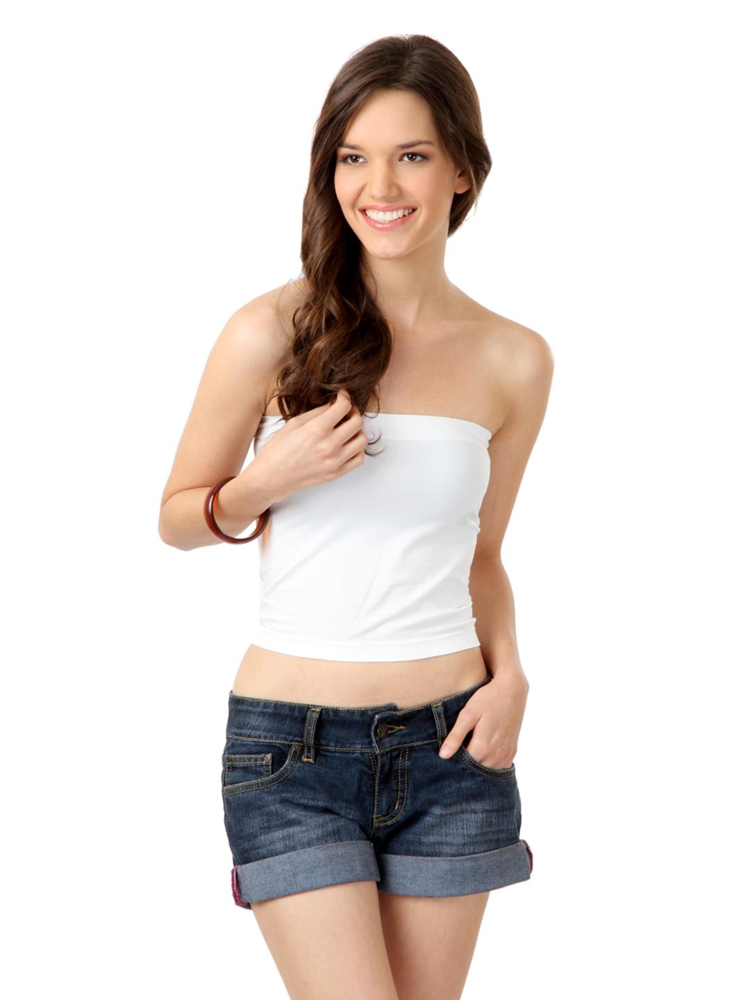
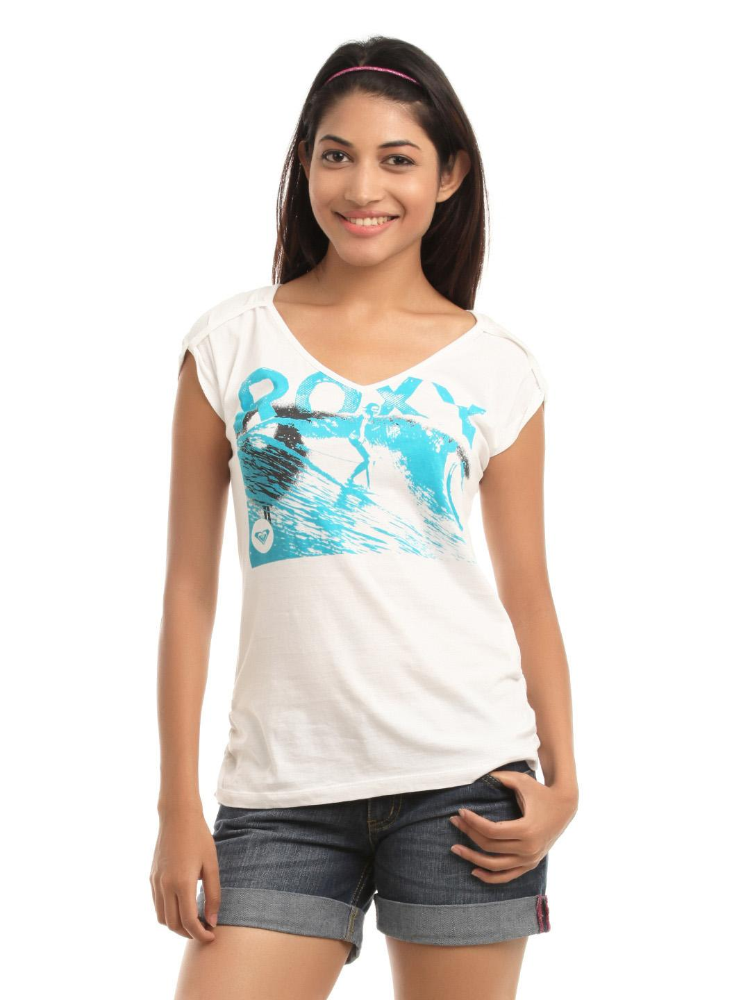
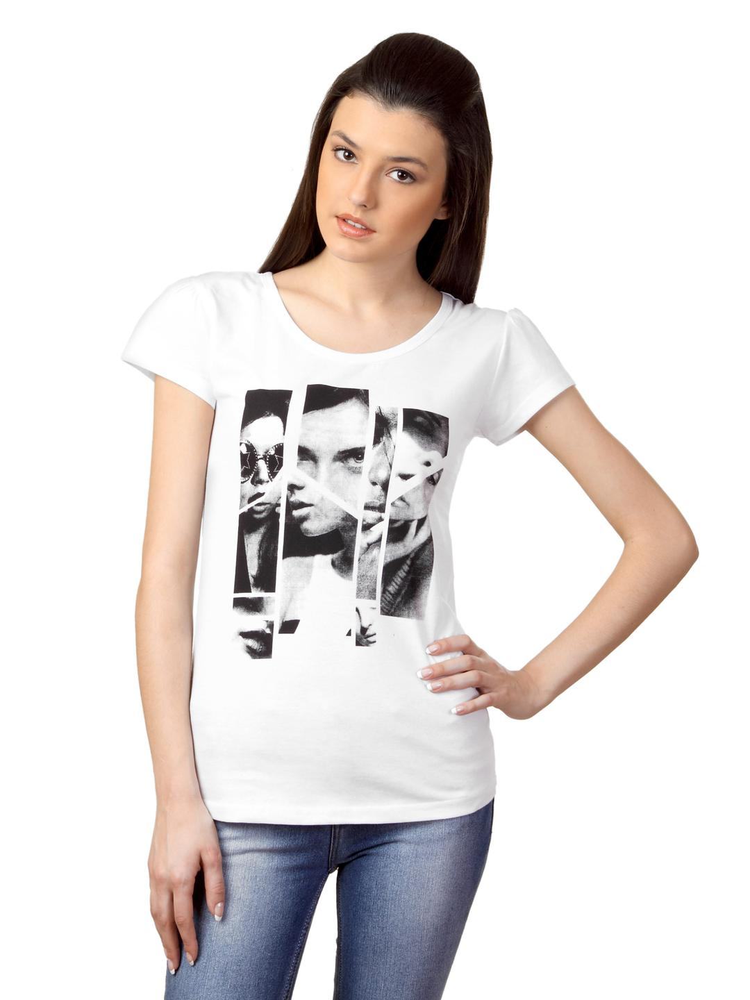
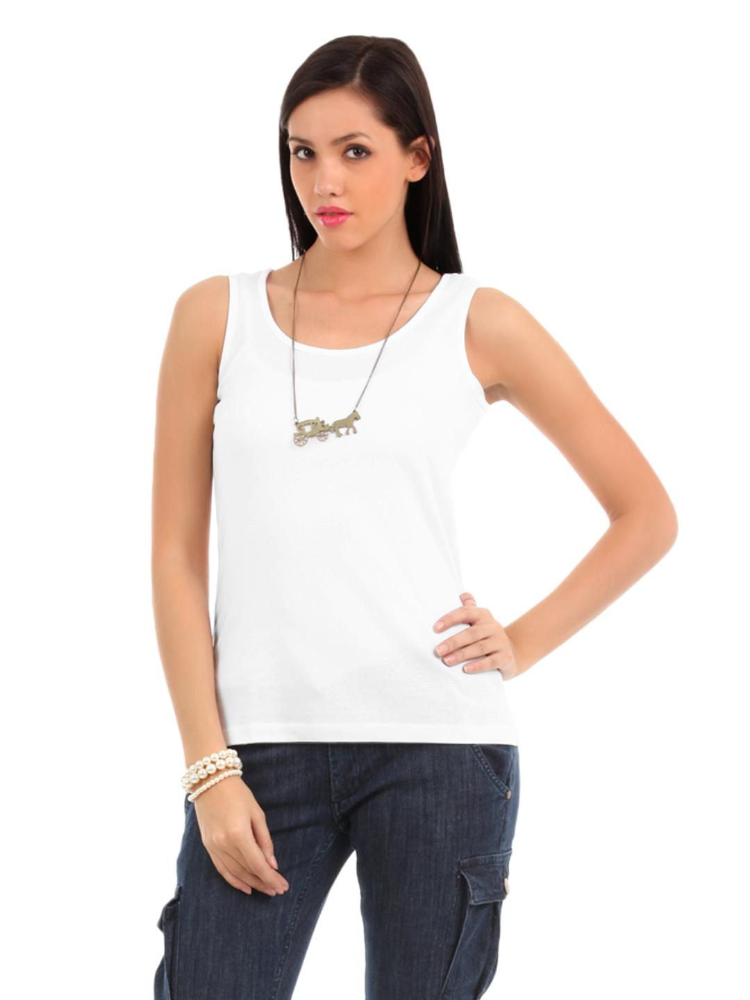
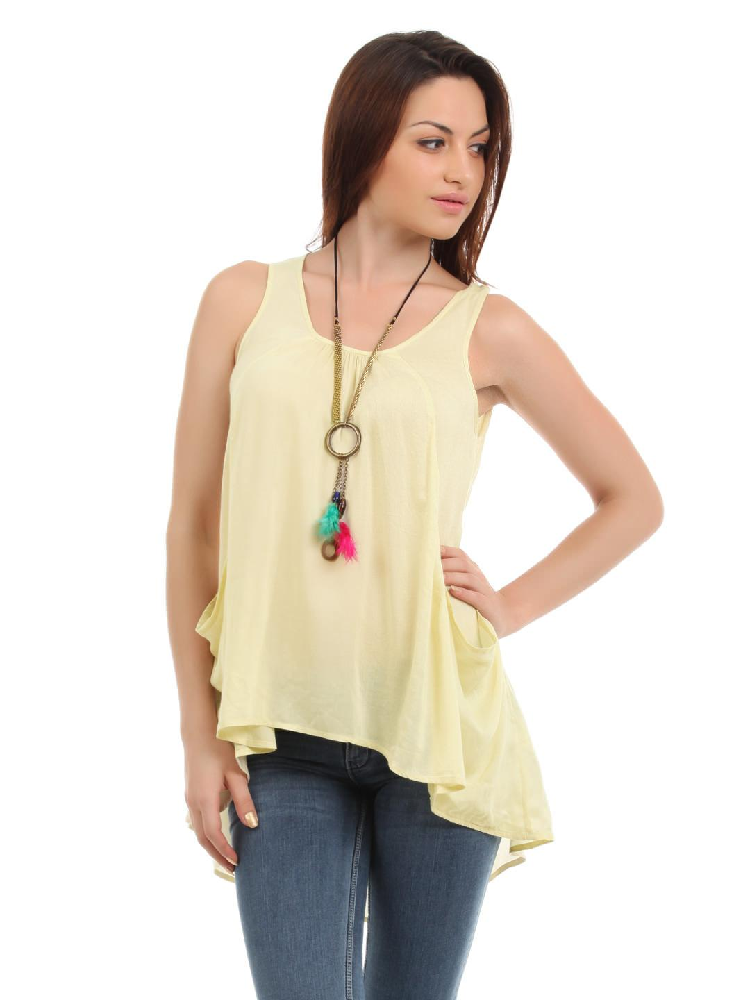


QUERY: sports shoes



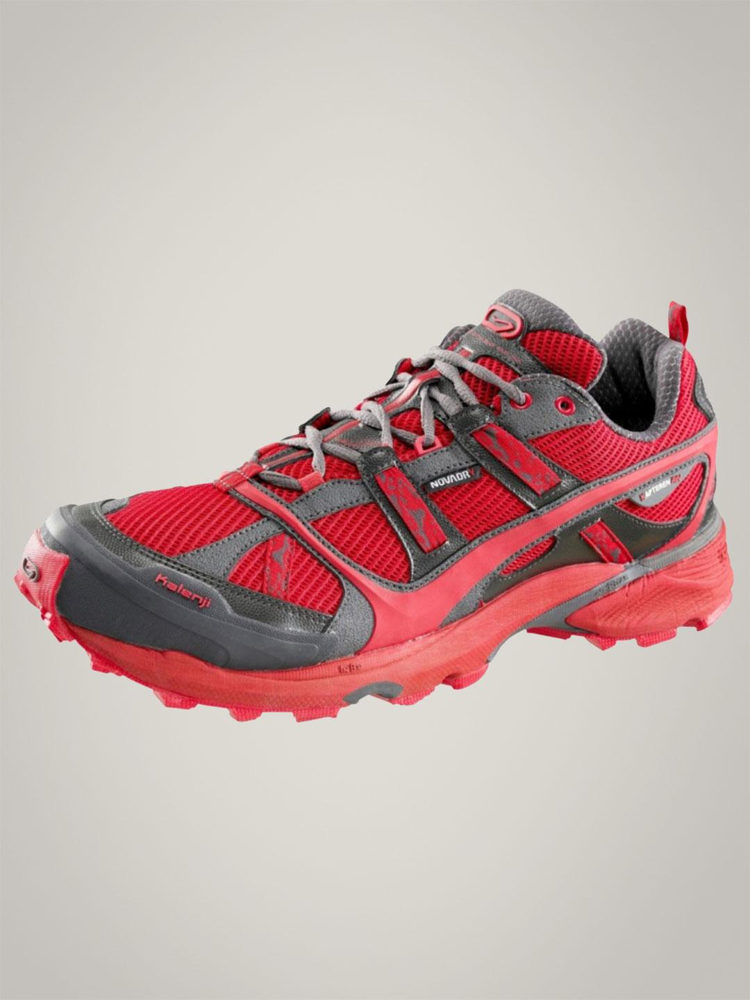
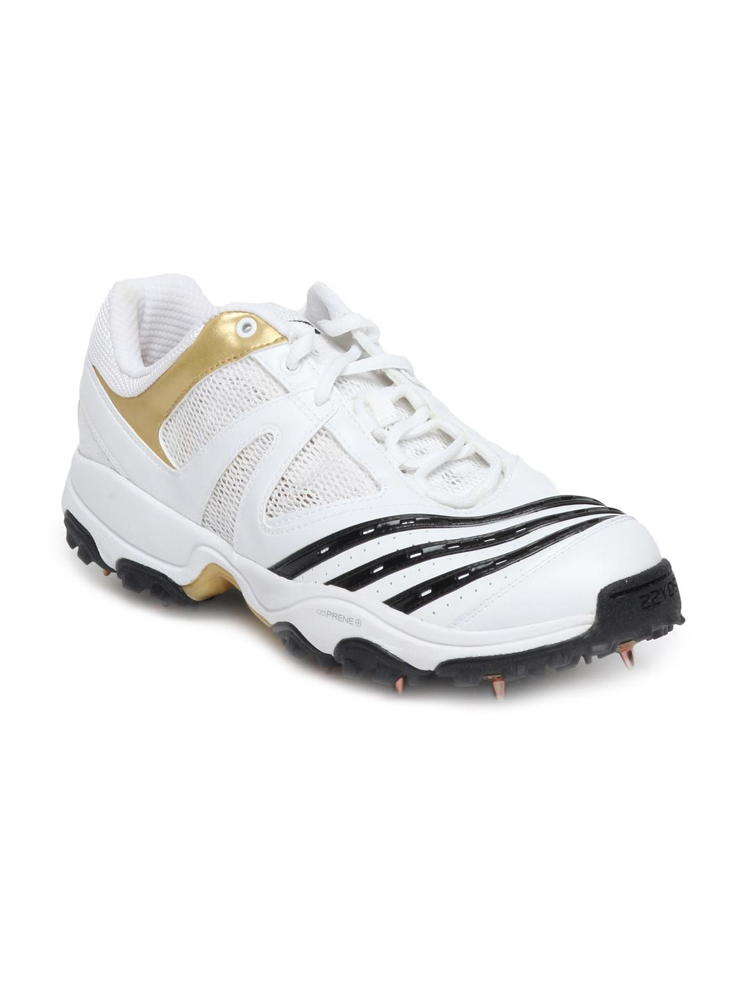
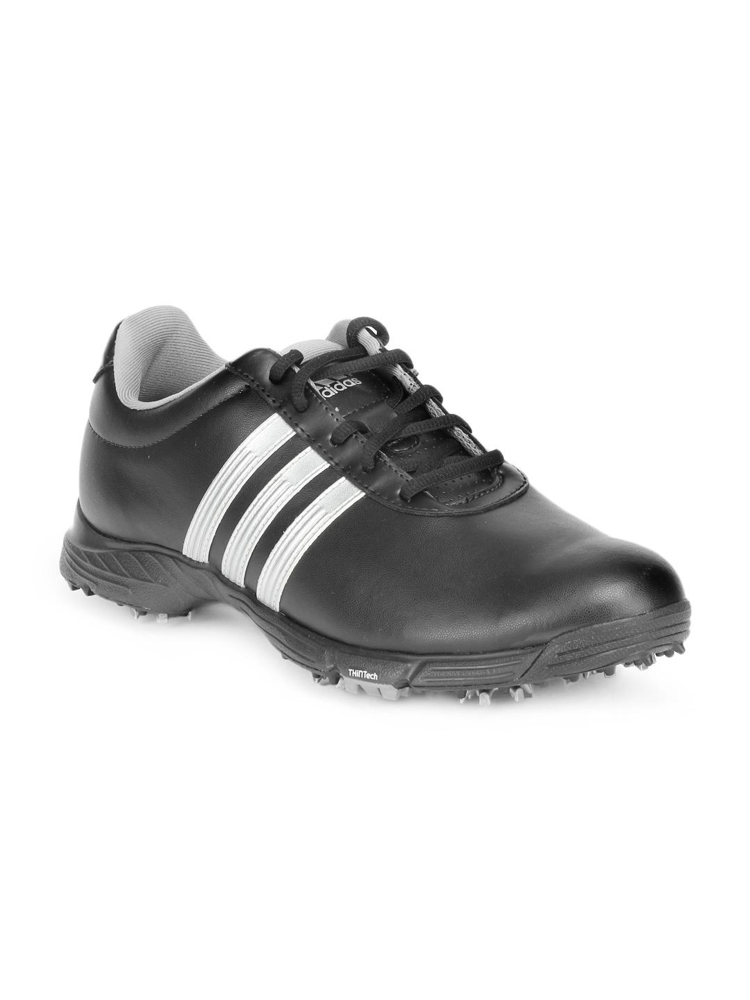
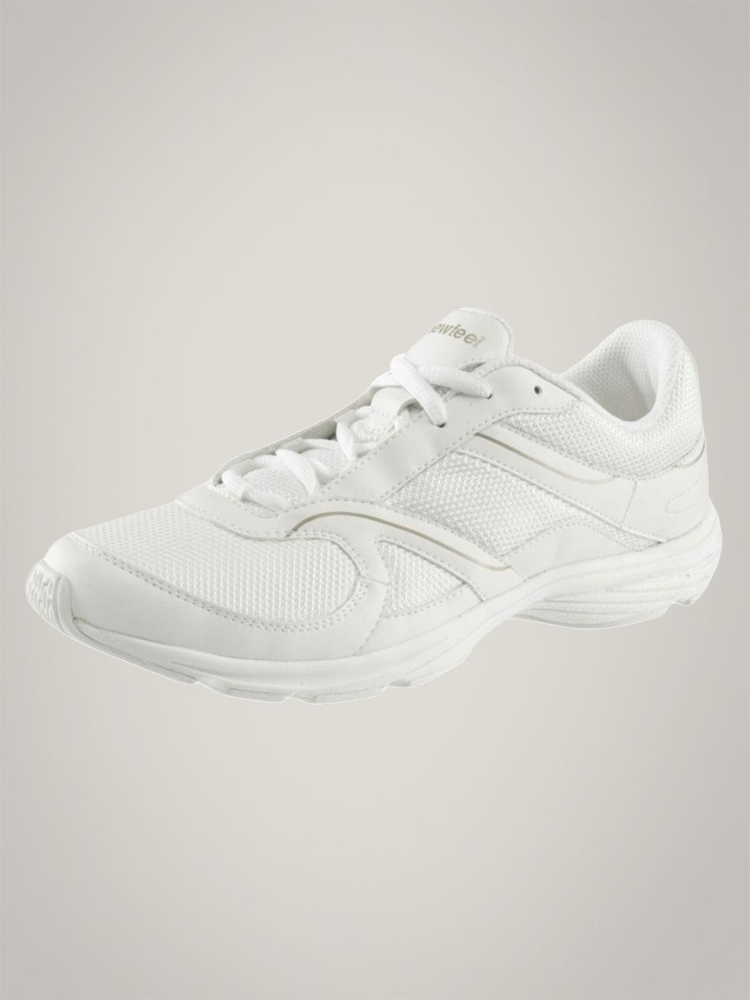
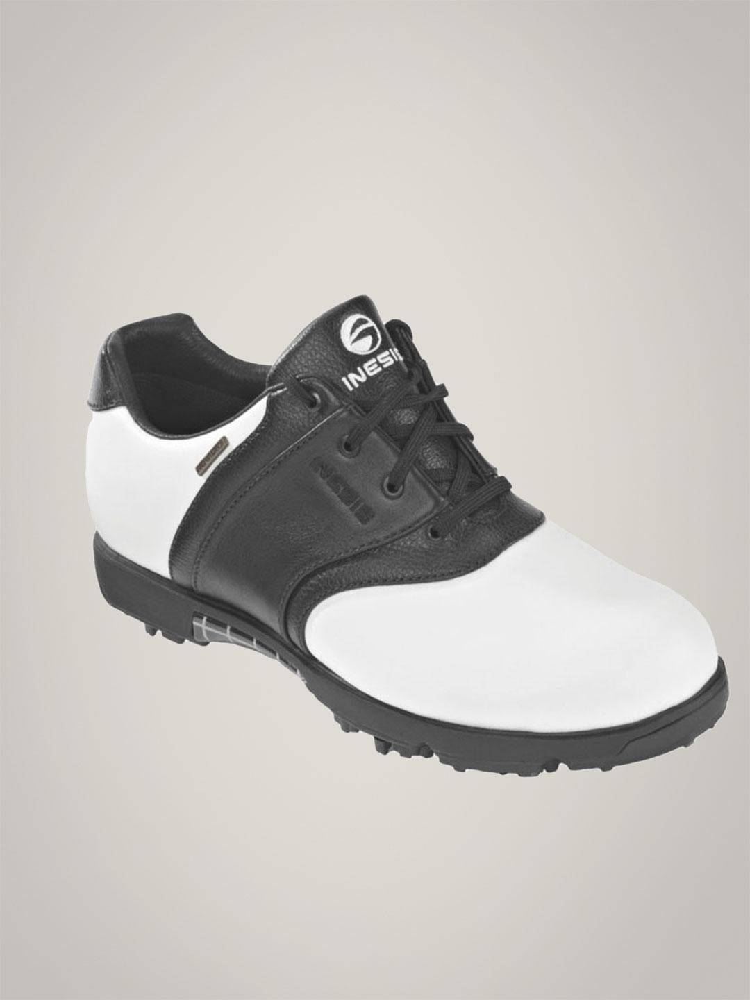
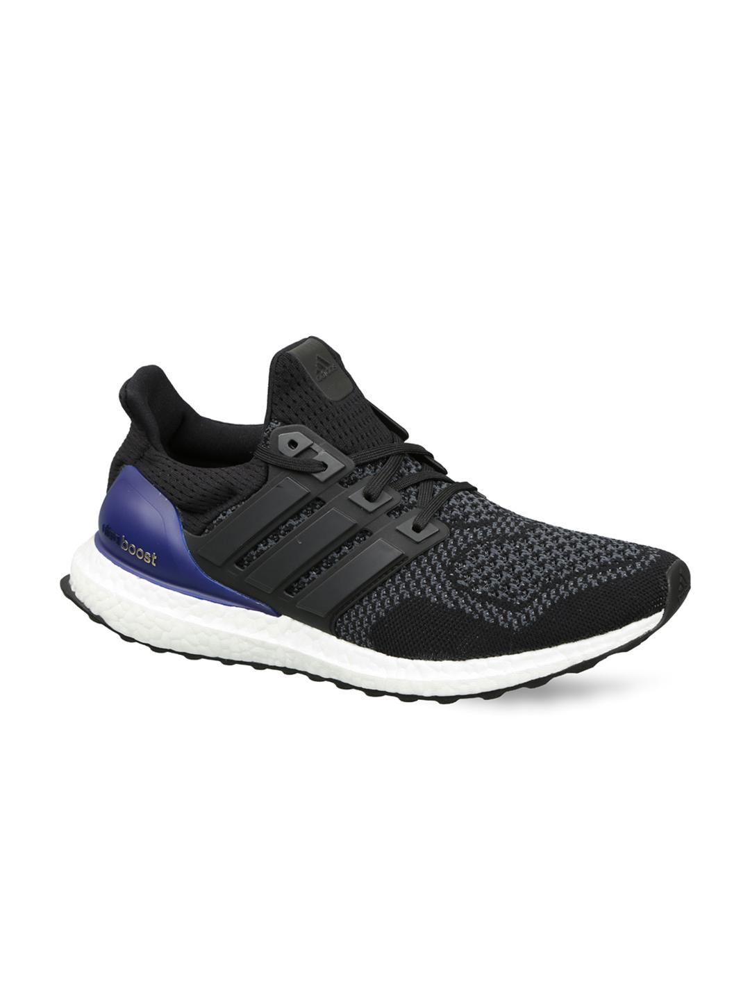

In [79]:
demo_queries = [
    "red floral dress",
    "black men's jacket",
    "blue denim jeans",
    "women white top",
    "sports shoes"
]

for query in demo_queries:
    print("\n==============================")
    print("QUERY:", query)
    print("==============================")
    results = search_by_text(query, k=6)
    show_results(results)


In [80]:
# ========== Cell X: K-Means Clustering on Multimodal Embeddings ==========

from sklearn.cluster import KMeans
import numpy as np
import os

# load multimodal embeddings
multi_path = os.path.join(dataset_path, "clip_outputs", "multimodal_embs.npy")
multimodal_embs = np.load(multi_path)

# choose number of clusters (you can change)
num_clusters = 10
print("Clustering into", num_clusters, "clusters...")

kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init='auto')
cluster_labels = kmeans.fit_predict(multimodal_embs)

df["cluster"] = cluster_labels
print("Clustering done!")
df[["display name", "category", "cluster"]].head()


Clustering into 10 clusters...
Clustering done!


,display name,category,cluster
0,Puma Men Black 65CC Lo Ducati Sports Shoes,Sports Shoes,1
1,Nike Men Charcoal Grey Shorts,Shorts,6
2,Kiara Women Teal Handbag,Handbags,9
3,Fastrack Women Freestyle Sports Analog Steel B...,Watches,2
4,ID Men Brown Casual Shoes,Casual Shoes,1


In [83]:
# ========== Generate Cluster Names ==========

cluster_names = {}

for cid in sorted(df["cluster"].unique()):
    subset = df[df["cluster"] == cid]
    dominant_category = subset["category"].value_counts().idxmax()
    cluster_names[cid] = dominant_category

cluster_names


{0: 'Tops',
 1: 'Casual Shoes',
 2: 'Watches',
 3: 'Tshirts',
 4: 'Shirts',
 5: 'Kurtas',
 6: 'Briefs',
 7: 'Heels',
 8: 'Perfume and Body Mist',
 9: 'Handbags'}


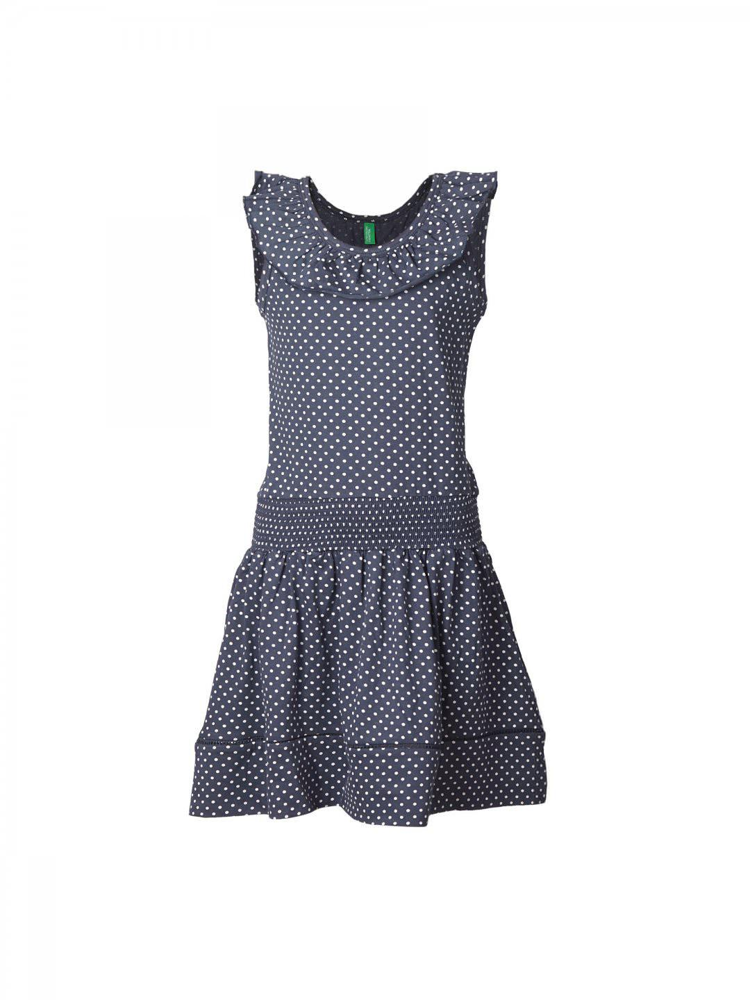
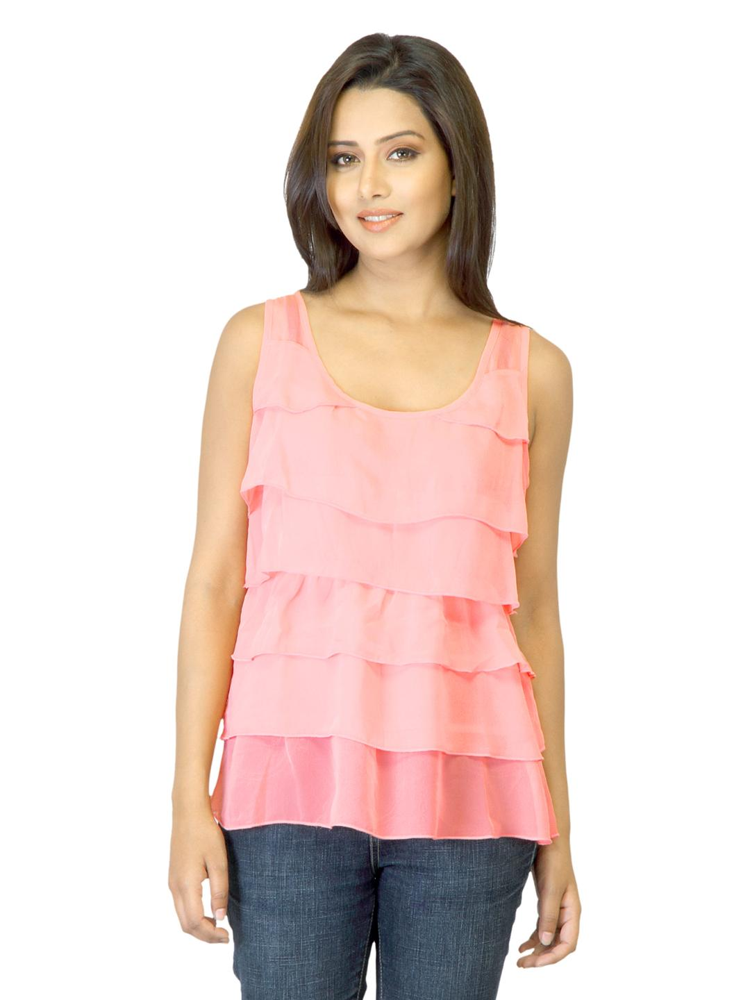
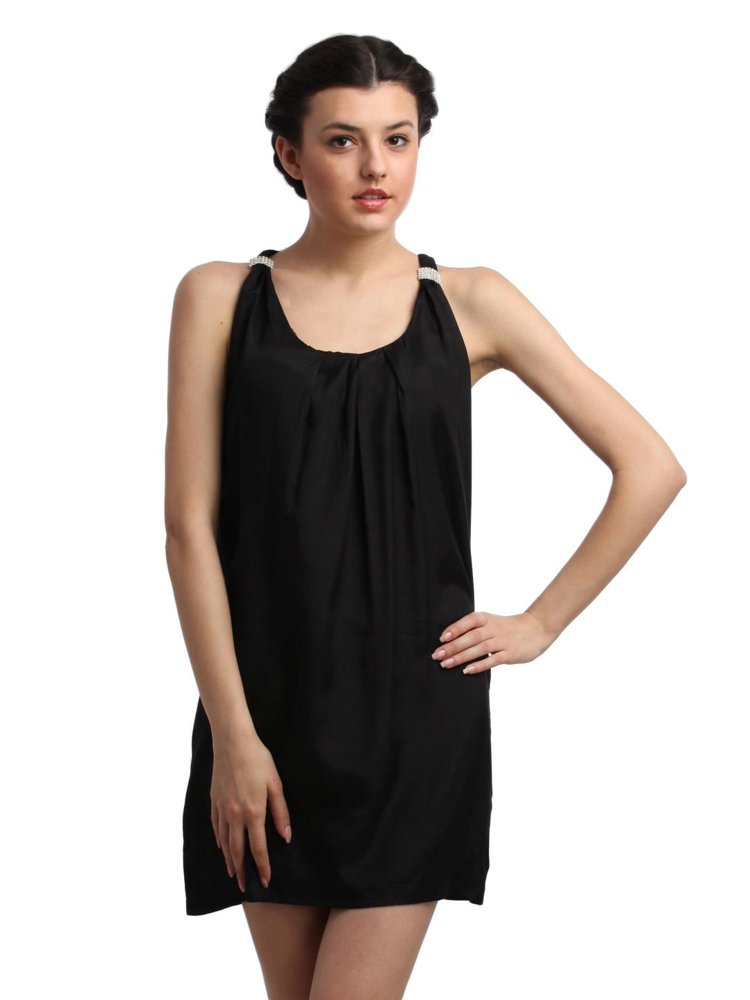
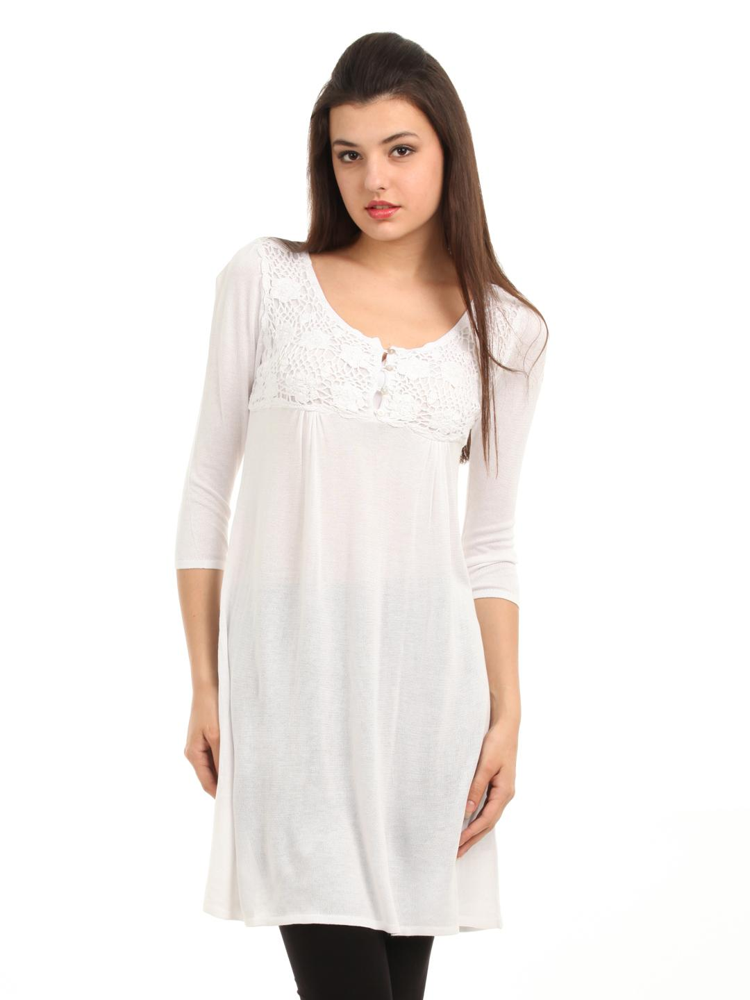
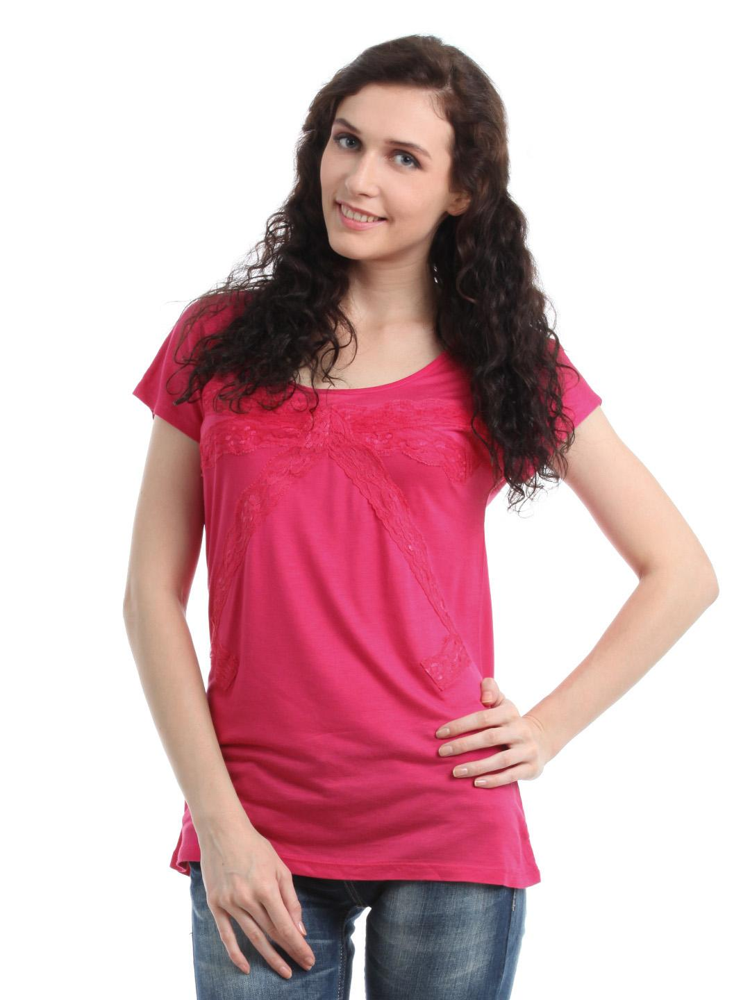
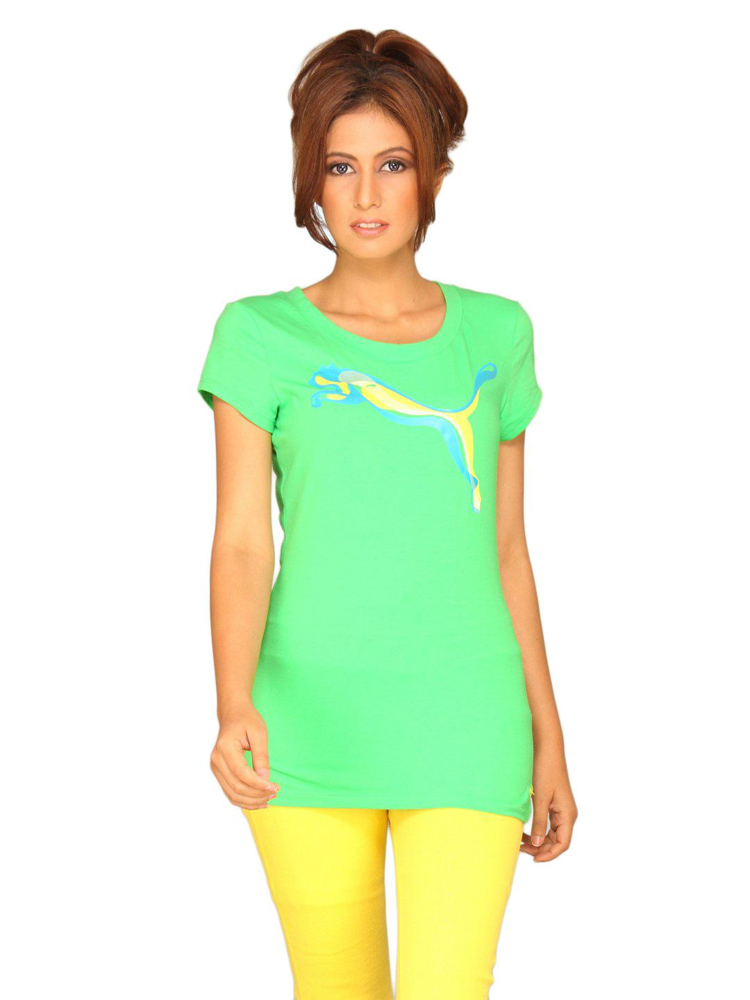
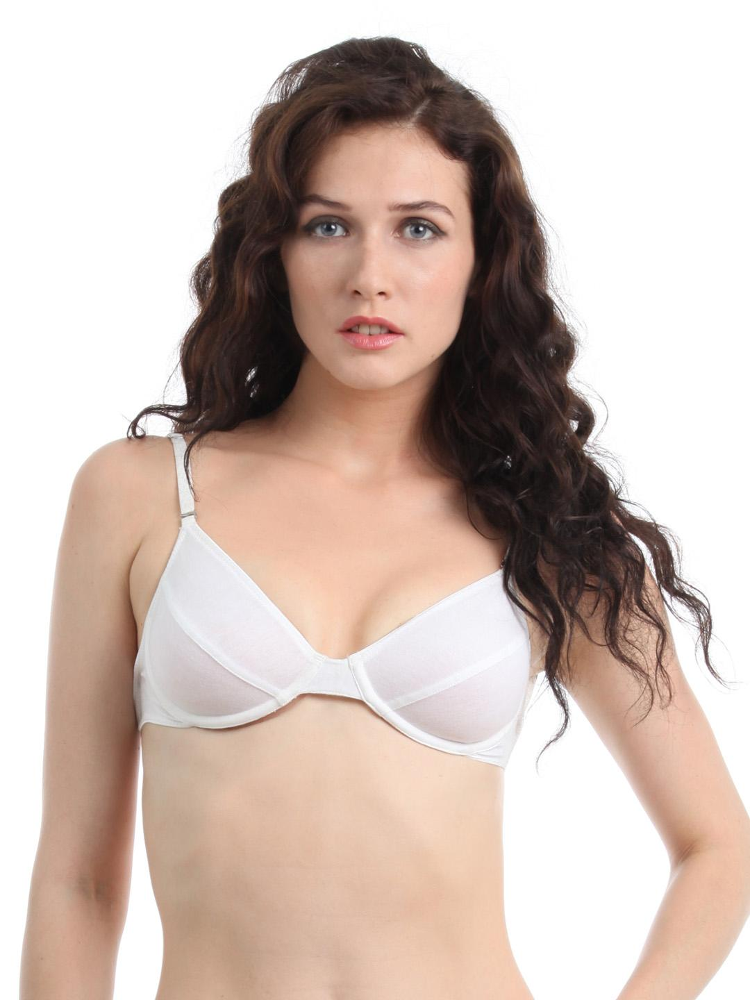
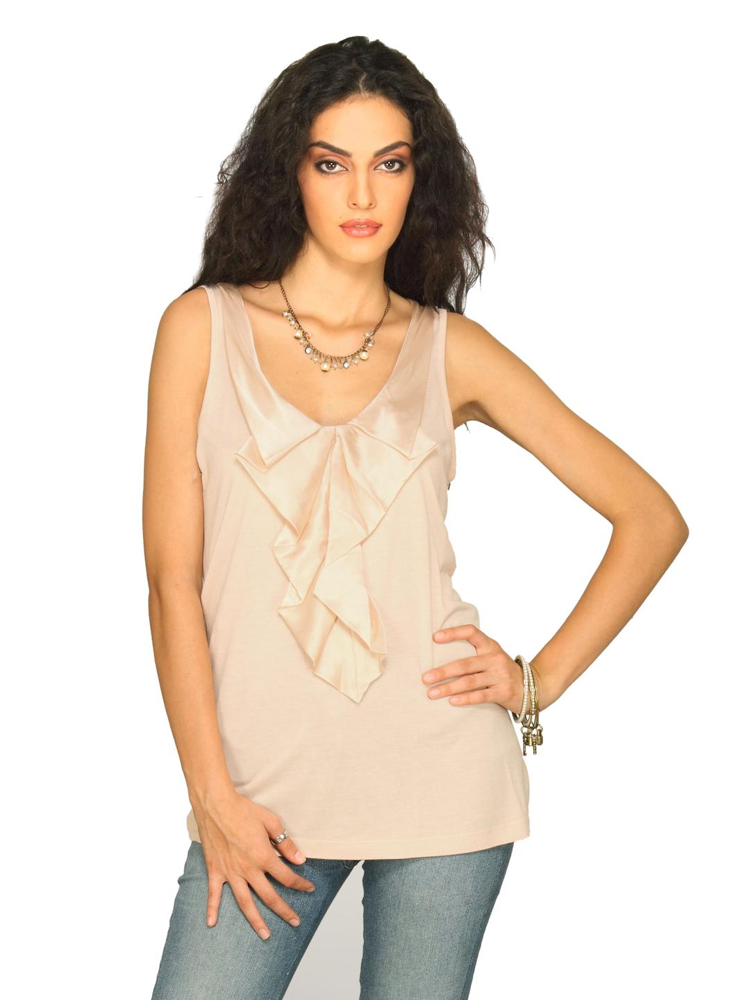
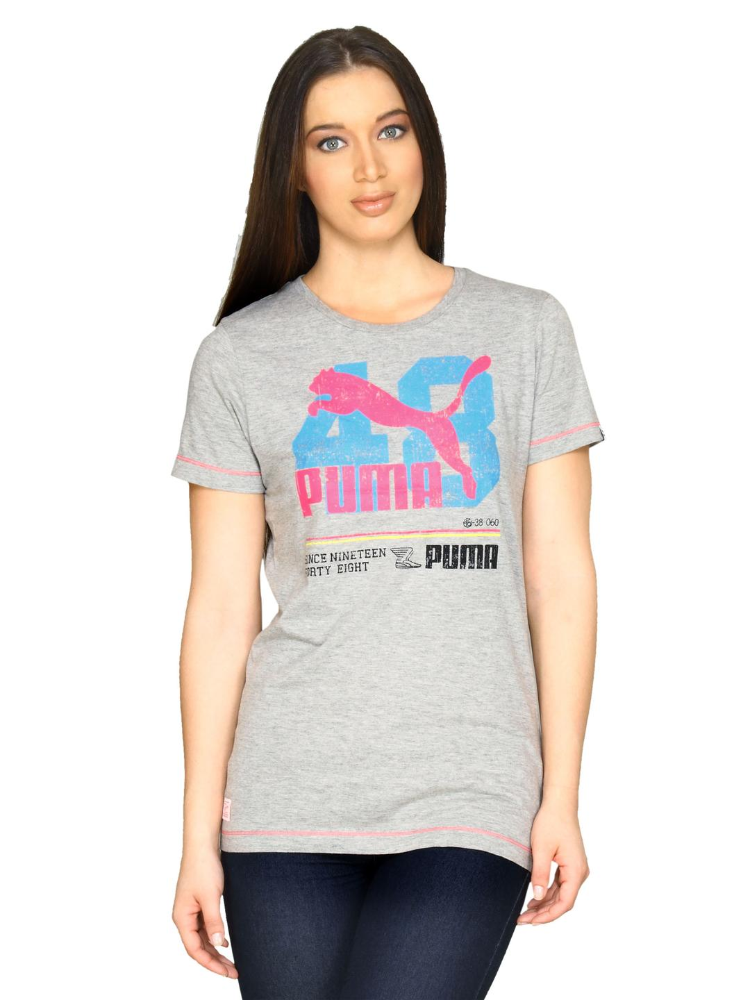
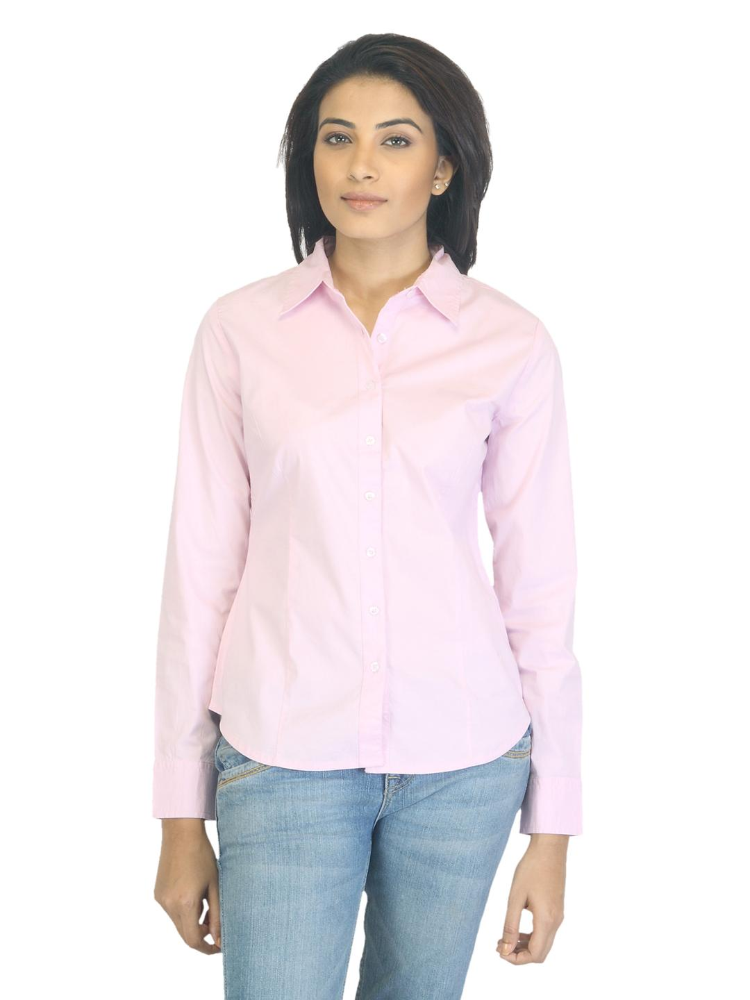

In [81]:
# ========== Cell Y: Show items from a chosen cluster ==========

def show_cluster(cluster_id, n=10):
    subset = df[df["cluster"] == cluster_id].sample(n)
    results = []
    for _, row in subset.iterrows():
        results.append({
            "score": 1.0,   # dummy score
            "image_path": row["image_path"],
            "display name": row["display name"],
            "category": row["category"],
            "description": row["description"],
        })
    show_results(results)

# Example: Show cluster 0
show_cluster(0, n=10)



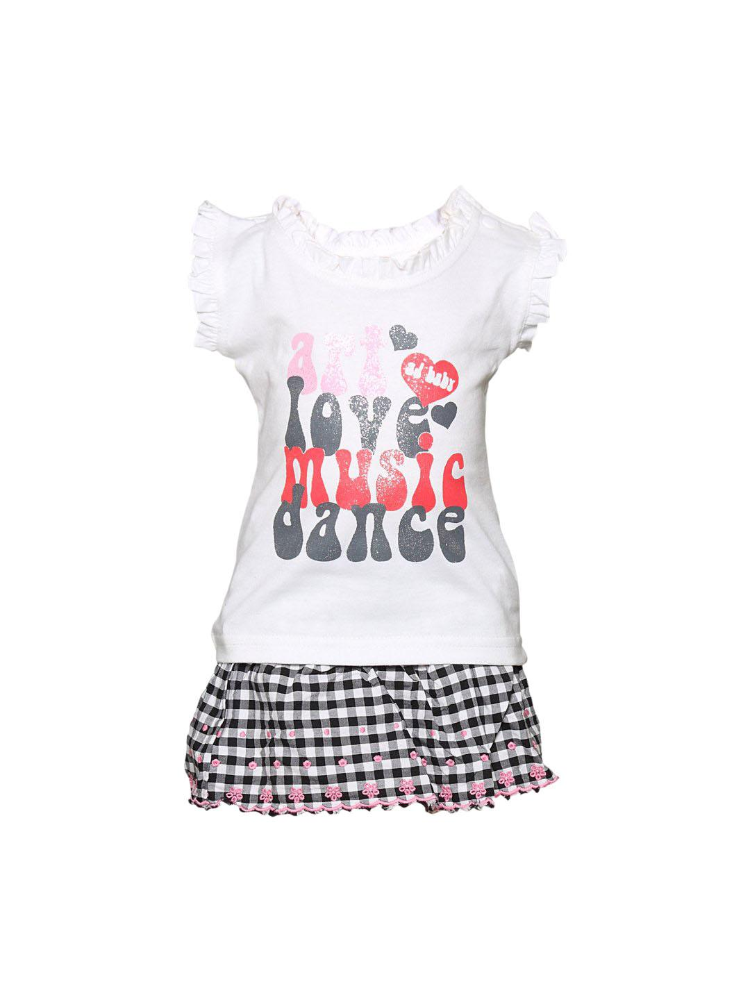
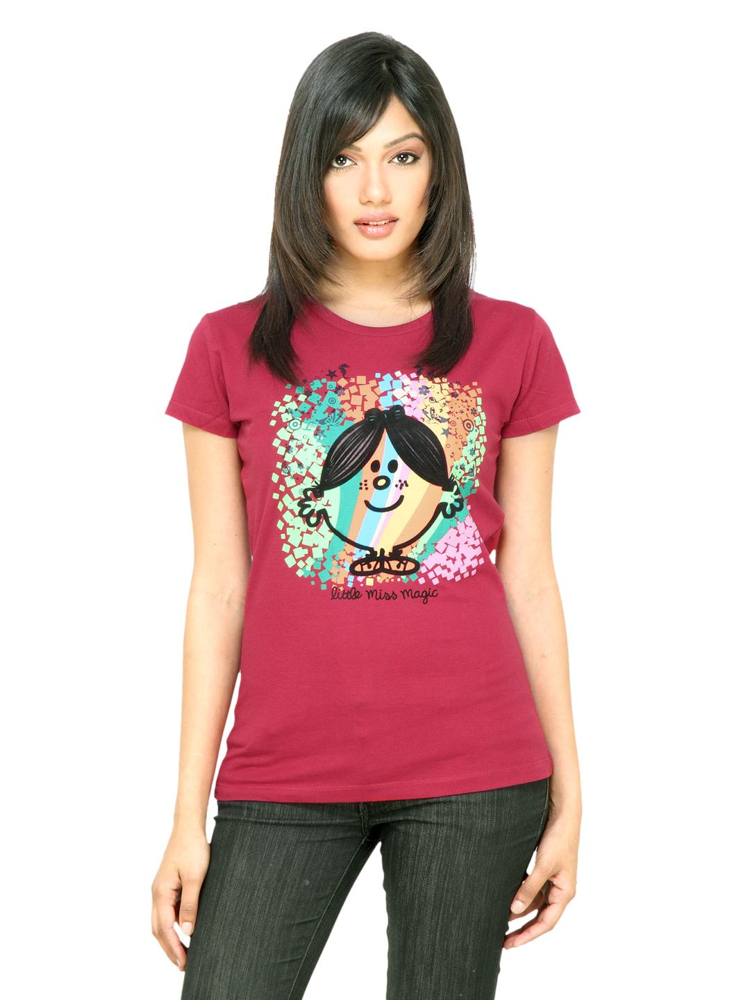
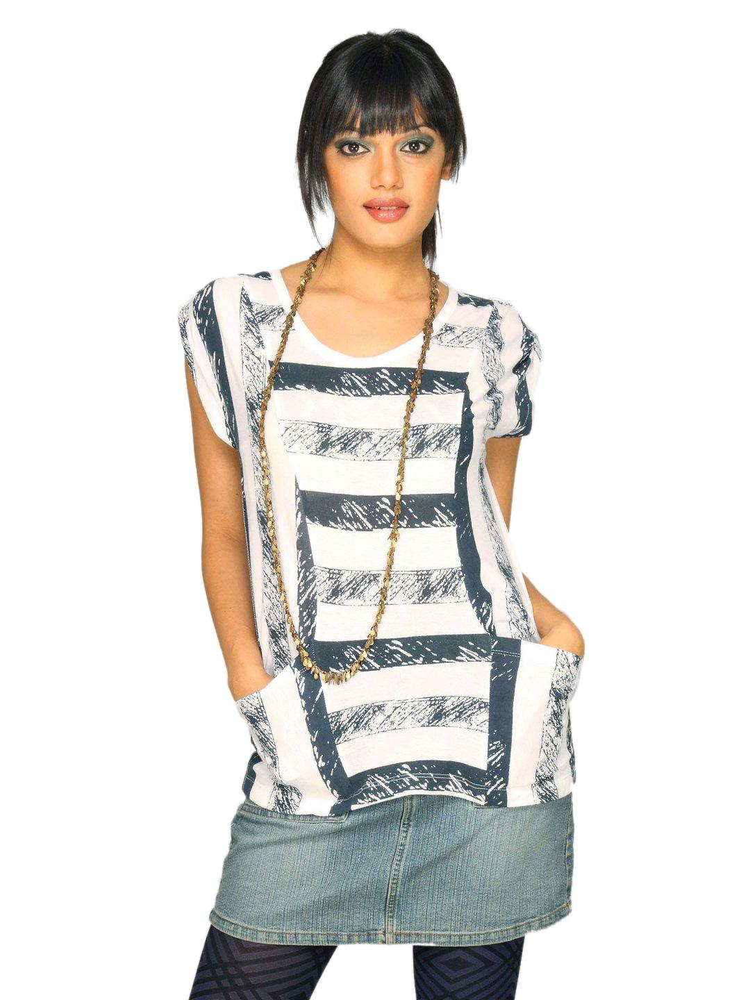
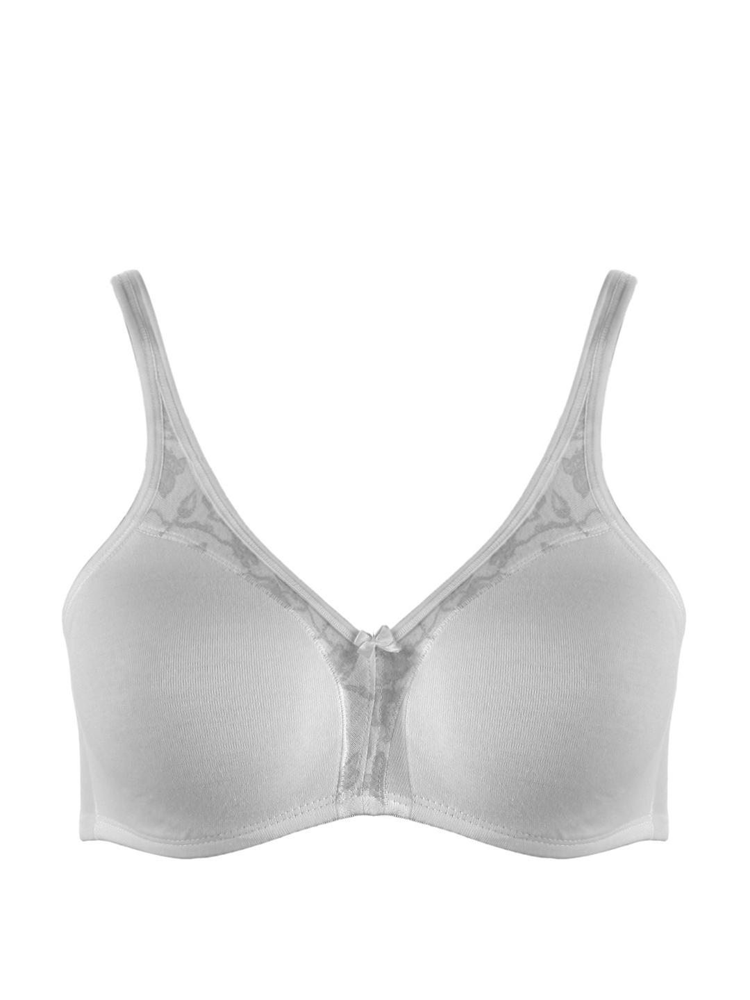
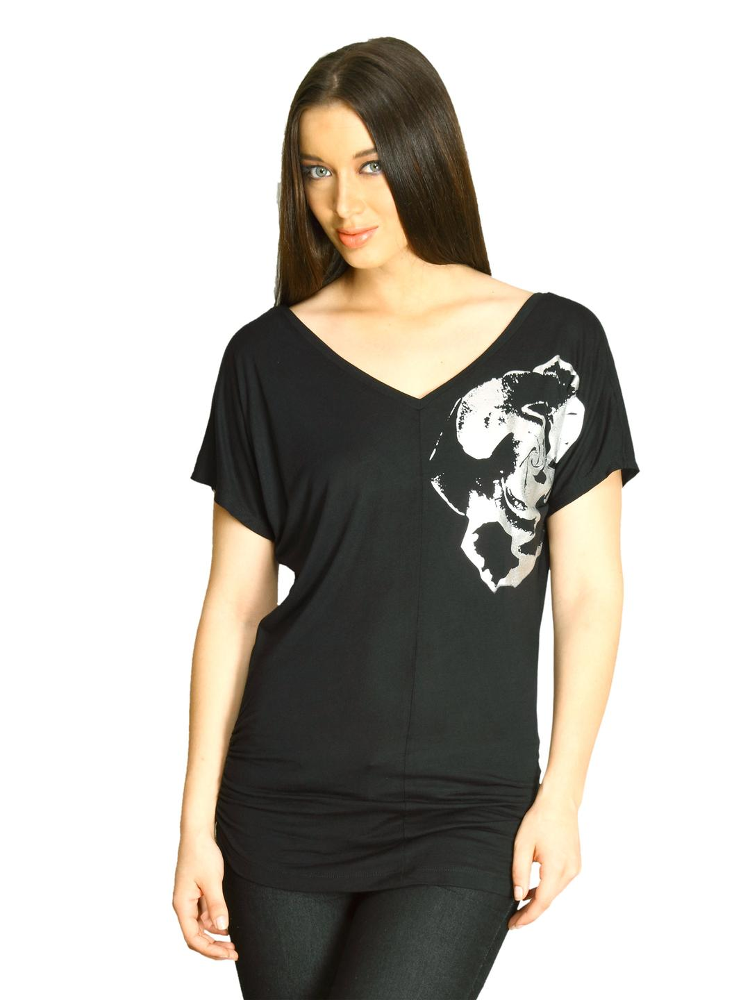
...
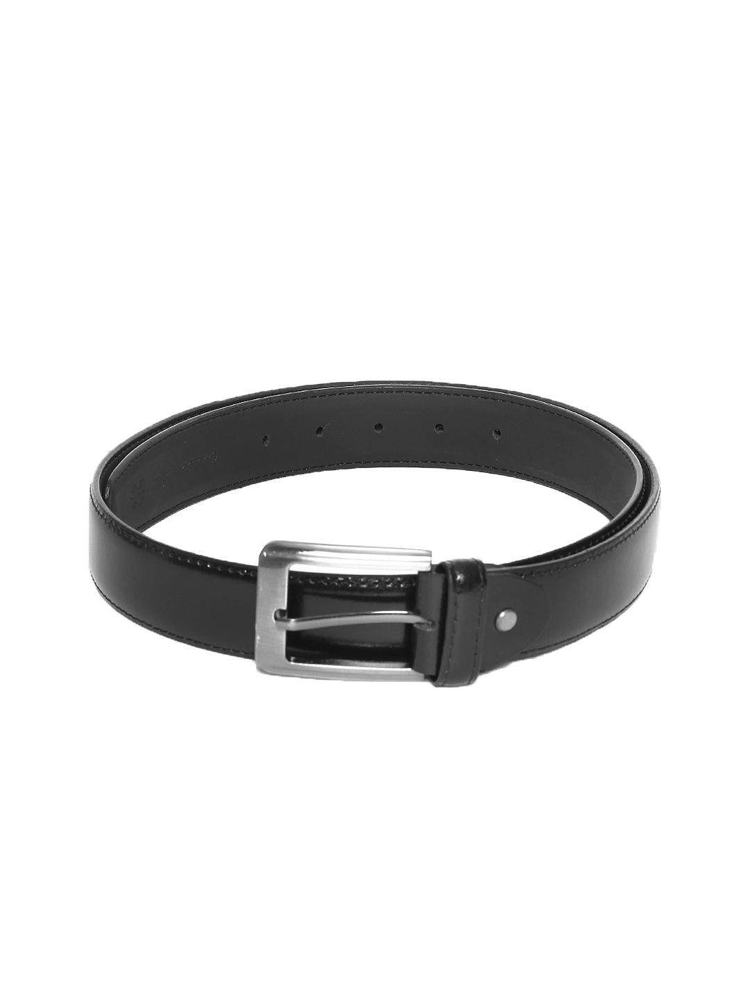
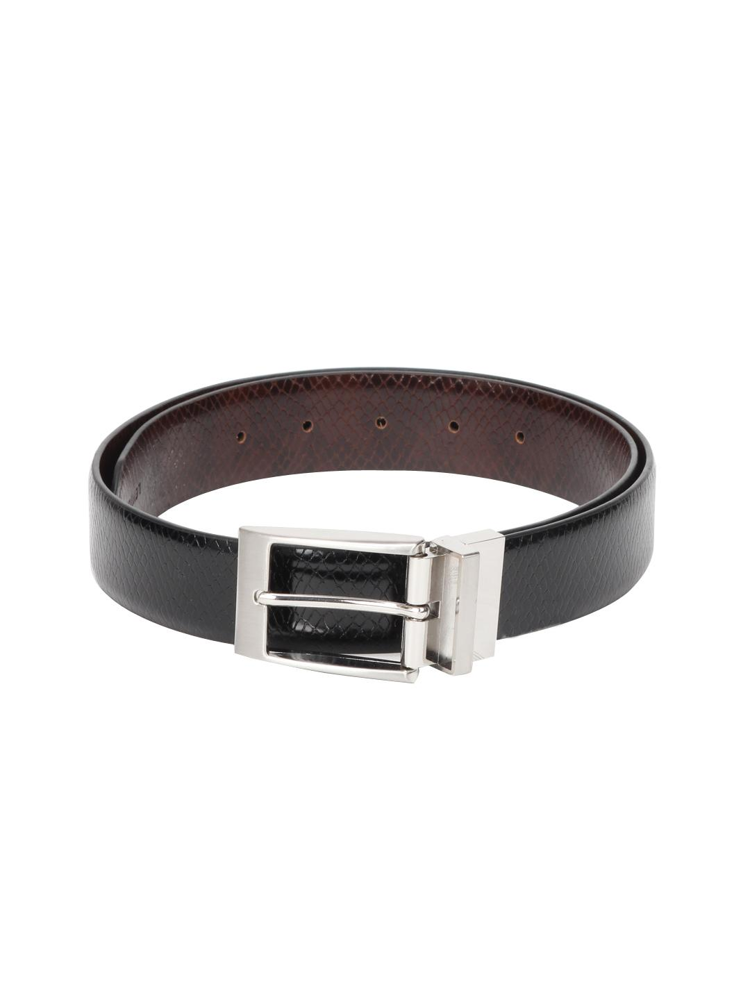
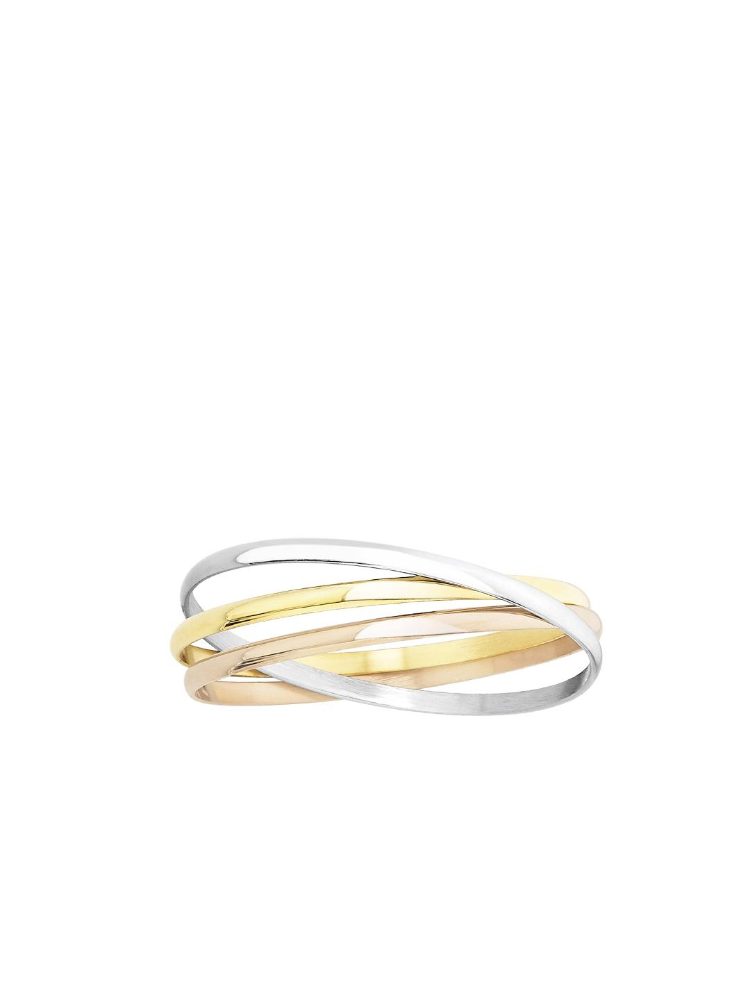
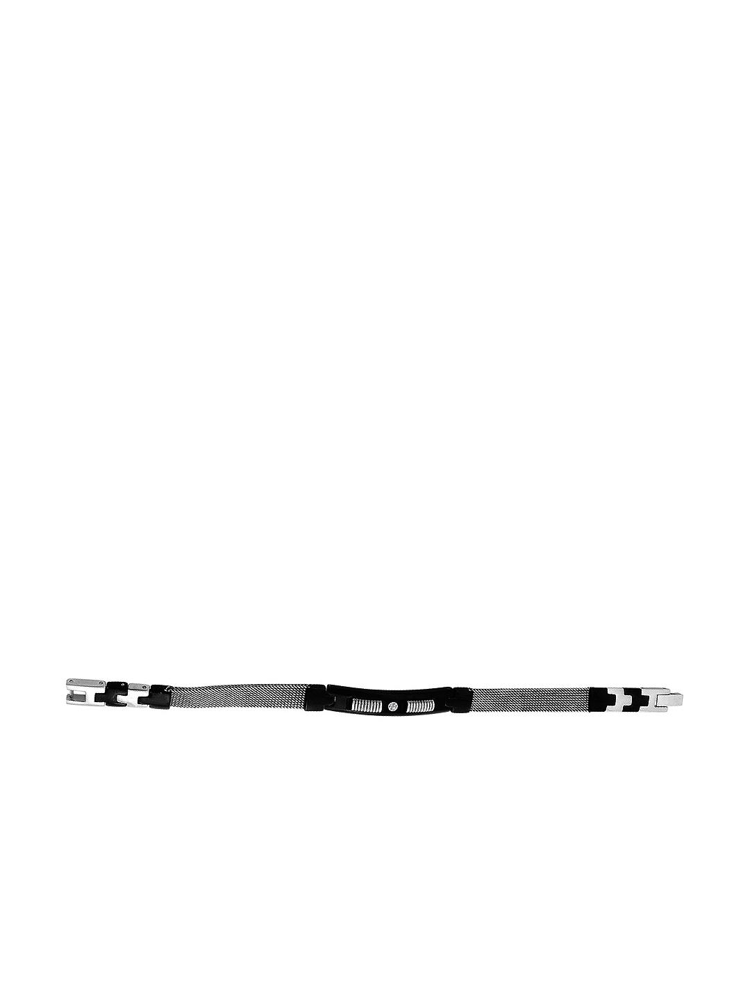
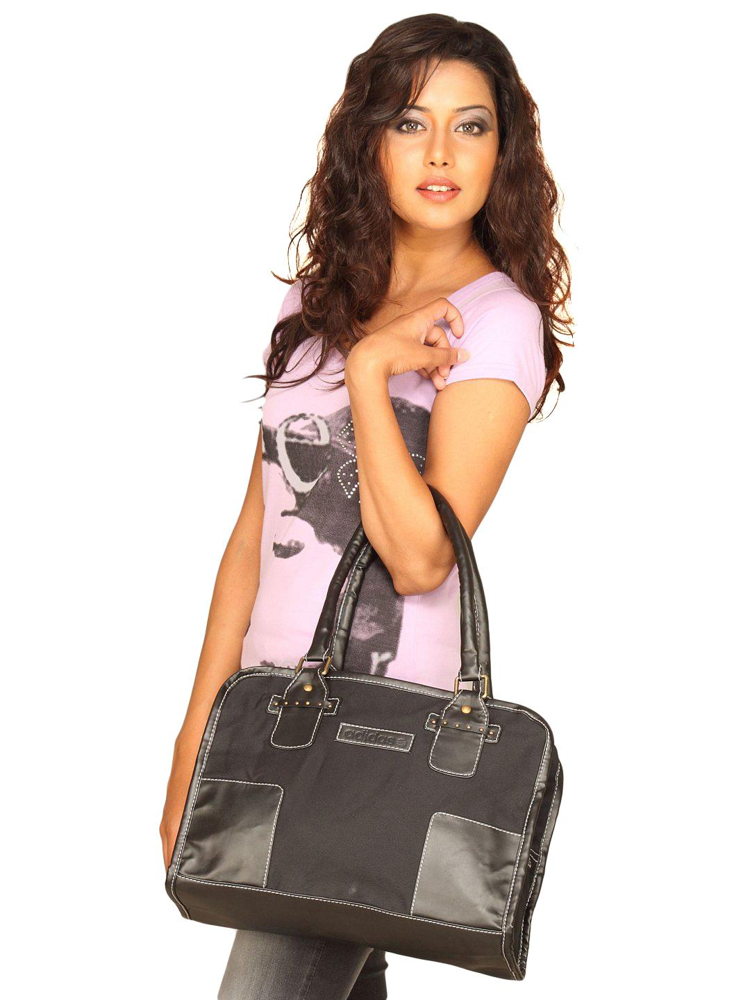

In [82]:
# Show all 10 clusters (0–9)
for cluster_id in range(10):
    show_cluster(cluster_id, n=10)


In [85]:
from sklearn.metrics import silhouette_score

score = silhouette_score(multimodal_embs, cluster_labels)
print("Silhouette Score:", score)


Silhouette Score: 0.110070005
